In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython
import pandas as pd
import h5py
import xarray as xr
import antipode

sc.settings.figdir=os.path.expanduser('~/WbFigures/RegionalClocks')
sc._settings.settings._vector_friendly = True
plt.rcParams.update({
    'figure.dpi': 100,
    'savefig.dpi': 300,
    'font.family': 'DejaVu Sans',
    'font.sans-serif': 'DejaVuSansMono',
    'pdf.fonttype': 42
})

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import antipode
from antipode.antipode_model import *
import antipode.model_functions
from antipode.model_functions import *
import antipode.model_distributions
from antipode.model_distributions import *
import antipode.model_modules
from antipode.model_modules import *
import antipode.train_utils
from antipode.train_utils import *
import antipode.plotting
from antipode.plotting import *

import torch
import pyro
import pyro.distributions as dist
from pyro.infer import SVI, JitTrace_ELBO
from pyro.optim import ClippedAdam
from pyro.infer.autoguide import AutoNormal


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is available
Number of GPUs: 1
GPU Name: NVIDIA A100-PCIE-40GB


In [2]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
seaborn.set_theme(style="ticks", rc=custom_params)


In [3]:

counts_pivot = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/progenitor_timepoint_counts.tsv',sep='\t',index_col=0)
counts_pivot_meta = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/progenitor_timepoint_counts_meta.tsv',sep='\t',index_col=0)

n_progenitor_zones = 20

# -- Load and preprocess data --
# Assume counts_pivot and counts_pivot_meta are already loaded pandas DataFrames
samples = counts_pivot.index.intersection(counts_pivot_meta.index)
counts_df = counts_pivot.loc[samples]
meta_df = counts_pivot_meta.loc[samples]

counts = torch.tensor(counts_df.values, dtype=torch.float)
N = torch.tensor(meta_df["total_count"].values, dtype=torch.float)
t = torch.tensor(meta_df["timepoint"].values, dtype=torch.float)
alpha = torch.ones(n_progenitor_zones, dtype=torch.float)#len(meta_df["simplified_region"].unique())+3

species_cat = meta_df["species"].astype("category")
species_of = torch.tensor(species_cat.cat.codes.values, dtype=torch.long)

num_species = len(species_cat.cat.categories)
num_states = counts.size(1)
num_regions = alpha.shape[0]

a_prior = torch.tensor([1., 166./280., 21/280]) #Currently don't think I should use

In [4]:
def model(t, N, species_of, counts):
    J, R, S = num_species, num_regions, num_states

    # learn per‐sample region logits (on GPU)
    region_logits = pyro.param(
        "region_logits",
        torch.zeros(counts.shape[0], R, device=device),
        constraint=pyro.distributions.constraints.real
    )
    region_of = torch.softmax(region_logits, dim=-1)  # [N,R] on GPU

    # species warp
    σ_a = pyro.sample("sigma_a", dist.HalfCauchy(1.0)).to(device)
    σ_b = pyro.sample("sigma_b", dist.HalfCauchy(1.0)).to(device)
    with pyro.plate("species", J):
        a = pyro.sample("a", dist.Normal(0.0, σ_a)).exp()
        b = pyro.sample("b", dist.Normal(0.0, σ_b))
    # region‐baseline as a simple parameter (already on GPU)
    rho = torch.softmax(
        pyro.param(
            "rho_param",
            torch.randn(R, S, device=device) * 0.1
        ),
        dim=-1
    )  # [R,S] on GPU

    # unimodal bumps
    with pyro.plate("states", S):
        mu         = pyro.sample("mu",         dist.HalfNormal(10.0)).to(device)
        sigma_rise = pyro.sample("sigma_rise", dist.HalfNormal(1.0)).to(device)
        sigma_fall = pyro.sample("sigma_fall", dist.HalfNormal(1.0)).to(device)
        A          = pyro.sample("A",          dist.Normal(0.0, 10.0)).to(device)

    # species×state offsets
    with pyro.plate("state_2", S), pyro.plate("species_2", J):
        delta_t = pyro.sample("delta_t", dist.Laplace(0.0, 1.0)).to(device)
        delta_h = pyro.sample("delta_h", dist.Laplace(0.0, 1.0)).to(device)

    with pyro.plate("data", len(t)):
        # 1) warp time [N]
        τ = a[species_of] * t + b[species_of]

        # 2) per‐species‐state peak shift [N,S]
        #    mu is [S] → broadcast to [N,S]
        mu_js = mu[None, :] + delta_t[species_of]           # [N,S]

        # 3) squared distance & piecewise σ [N,S]
        z2    = (τ.unsqueeze(-1) - mu_js)**2                # [N,S]
        σ     = torch.where(
                    τ.unsqueeze(-1) < mu_js,
                    sigma_rise, sigma_fall                  # both [S] → [N,S]
                )

        log_time = (A[None, :] + delta_h[species_of]) \
                   - z2/(2*σ**2)                           # [N,S]

        # 5) region mixing [N,S]
        rho_mix = region_of @ rho                         # [N,S]
        log_reg = torch.log(rho_mix + 1e-12)              # [N,S]

        # 6) final probs [N,S]
        logits = log_reg + log_time
        pi     = torch.softmax(logits, dim=-1)

        # 7a) Poisson surrogate for vectorized per‐sample N
        rate = N.unsqueeze(-1) * pi                       # [N,S]
        rate = rate + 1e-2
        pyro.sample("obs",
                    dist.Poisson(rate).to_event(1),
                    obs=counts)


  0%|          | 2/10000 [00:00<43:18,  3.85it/s]  

[0] ELBO = -6059122.5


  5%|▌         | 502/10000 [00:51<16:01,  9.87it/s]

[500] ELBO = -350629.4


 10%|█         | 1002/10000 [01:42<15:09,  9.89it/s]

[1000] ELBO = -152844.5


 15%|█▌        | 1502/10000 [02:32<14:20,  9.87it/s]

[1500] ELBO = -147400.7


 20%|██        | 2002/10000 [03:23<13:32,  9.85it/s]

[2000] ELBO = -145074.4


 25%|██▌       | 2502/10000 [04:14<12:38,  9.88it/s]

[2500] ELBO = -147124.3


 30%|███       | 3002/10000 [05:05<11:47,  9.88it/s]

[3000] ELBO = -142964.2


 35%|███▌      | 3502/10000 [05:56<10:58,  9.87it/s]

[3500] ELBO = -143452.9


 40%|████      | 4002/10000 [06:47<10:07,  9.88it/s]

[4000] ELBO = -141866.8


 45%|████▌     | 4502/10000 [07:38<09:16,  9.87it/s]

[4500] ELBO = -141891.6


 50%|█████     | 5002/10000 [08:28<08:26,  9.86it/s]

[5000] ELBO = -141889.0


 55%|█████▌    | 5502/10000 [09:19<07:36,  9.85it/s]

[5500] ELBO = -142031.3


 60%|██████    | 6002/10000 [10:10<06:45,  9.86it/s]

[6000] ELBO = -141612.0


 65%|██████▌   | 6502/10000 [11:01<05:55,  9.84it/s]

[6500] ELBO = -141203.3


 70%|███████   | 7002/10000 [11:51<05:01,  9.94it/s]

[7000] ELBO = -141357.9


 75%|███████▌  | 7503/10000 [12:42<04:10,  9.97it/s]

[7500] ELBO = -141284.1


 80%|████████  | 8003/10000 [13:32<03:20,  9.97it/s]

[8000] ELBO = -141451.6


 85%|████████▌ | 8502/10000 [14:23<02:30,  9.98it/s]

[8500] ELBO = -141747.8


 90%|█████████ | 9003/10000 [15:13<01:39, 10.05it/s]

[9000] ELBO = -141943.7


 95%|█████████▌| 9503/10000 [16:03<00:49, 10.05it/s]

[9500] ELBO = -142155.0


100%|██████████| 10000/10000 [16:53<00:00,  9.87it/s]


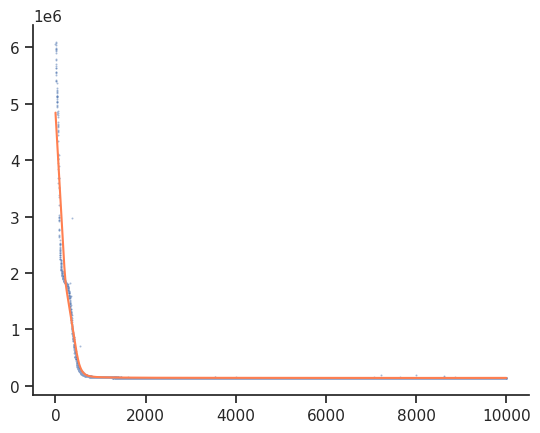

  0%|          | 2/10000 [00:00<17:00,  9.80it/s]

[0] ELBO = -141293.2


  5%|▌         | 503/10000 [00:50<15:48, 10.01it/s]

[500] ELBO = -139520.9


 10%|█         | 1003/10000 [01:40<15:01,  9.98it/s]

[1000] ELBO = -138428.8


 15%|█▌        | 1503/10000 [02:31<14:06, 10.04it/s]

[1500] ELBO = -138226.1


 20%|██        | 2002/10000 [03:21<13:23,  9.96it/s]

[2000] ELBO = -137975.5


 25%|██▌       | 2503/10000 [04:11<12:25, 10.06it/s]

[2500] ELBO = -137723.7


 30%|███       | 3003/10000 [05:01<11:39, 10.00it/s]

[3000] ELBO = -137705.9


 35%|███▌      | 3502/10000 [05:51<10:44, 10.08it/s]

[3500] ELBO = -137772.0


 40%|████      | 4003/10000 [06:41<09:54, 10.09it/s]

[4000] ELBO = -137546.4


 45%|████▌     | 4502/10000 [07:30<09:04, 10.10it/s]

[4500] ELBO = -137520.9


 50%|█████     | 5003/10000 [08:20<08:12, 10.14it/s]

[5000] ELBO = -137753.8


 55%|█████▌    | 5502/10000 [09:10<07:24, 10.13it/s]

[5500] ELBO = -137119.0


 60%|██████    | 6003/10000 [10:00<06:37, 10.05it/s]

[6000] ELBO = -137439.1


 65%|██████▌   | 6502/10000 [10:49<05:51,  9.95it/s]

[6500] ELBO = -137311.8


 70%|███████   | 7001/10000 [11:38<04:59, 10.02it/s]

[7000] ELBO = -137158.5


 75%|███████▌  | 7503/10000 [12:28<04:06, 10.13it/s]

[7500] ELBO = -137406.5


 80%|████████  | 8002/10000 [13:18<03:17, 10.14it/s]

[8000] ELBO = -137241.1


 85%|████████▌ | 8502/10000 [14:07<02:30,  9.96it/s]

[8500] ELBO = -137579.3


 90%|█████████ | 9002/10000 [14:57<01:38, 10.12it/s]

[9000] ELBO = -137740.3


 95%|█████████▌| 9503/10000 [15:47<00:49, 10.13it/s]

[9500] ELBO = -137767.1


100%|██████████| 10000/10000 [16:36<00:00, 10.03it/s]


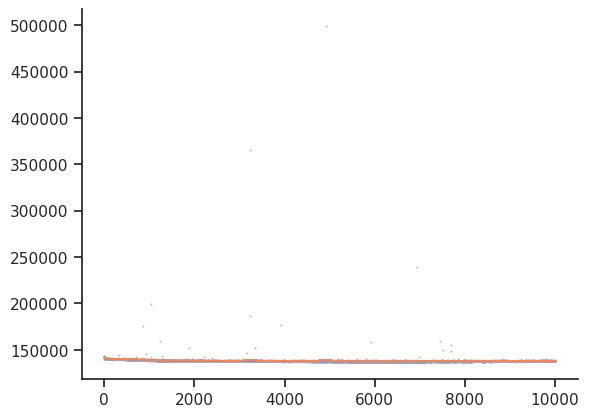

In [5]:
from pyro.infer.autoguide import AutoNormal, init_to_uniform

pyro.clear_param_store()
guide = AutoNormal(model)
guide.to(device)
pyro.validation_enabled(True)
torch.autograd.set_detect_anomaly(True)


optimizer = ClippedAdam({"lr": 2e-2})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

t, N, species_of, counts = t.to(device), N.to(device), species_of.to(device), counts.to(device)

# fitting loop
losses = []
for step in tqdm.tqdm(range(10000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")
antipode.plotting.plot_loss(losses)

losses = []
optimizer = ClippedAdam({"lr": 8e-3})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())


# fitting loop
for step in tqdm.tqdm(range(10000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

antipode.plotting.plot_loss(losses)

In [6]:
optimizer = ClippedAdam({"lr": 4e-3})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())
losses = []
# fitting loop
for step in tqdm.tqdm(range(10000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 1e-3})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

# fitting loop
for step in tqdm.tqdm(range(10000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 5e-4})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

# fitting loop
losses = []
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 1e-4})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

# fitting loop
losses = []
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 1e-5})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

# fitting loop
losses = []
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

  0%|          | 3/10000 [00:00<16:40,  9.99it/s]

[0] ELBO = -137784.7


  5%|▌         | 503/10000 [00:49<15:42, 10.07it/s]

[500] ELBO = -137007.2


 10%|█         | 1002/10000 [01:38<14:46, 10.15it/s]

[1000] ELBO = -136738.5


 15%|█▌        | 1502/10000 [02:28<13:57, 10.14it/s]

[1500] ELBO = -136785.9


 20%|██        | 2003/10000 [03:18<13:09, 10.13it/s]

[2000] ELBO = -136969.1


 25%|██▌       | 2502/10000 [04:07<12:21, 10.12it/s]

[2500] ELBO = -137066.4


 30%|███       | 3003/10000 [04:57<12:48,  9.10it/s]

[3000] ELBO = -136963.3


 35%|███▌      | 3503/10000 [05:46<10:40, 10.14it/s]

[3500] ELBO = -136562.1


 40%|████      | 4002/10000 [06:35<09:50, 10.15it/s]

[4000] ELBO = -136936.7


 45%|████▌     | 4503/10000 [07:25<09:02, 10.13it/s]

[4500] ELBO = -136808.2


 50%|█████     | 5002/10000 [08:14<08:12, 10.15it/s]

[5000] ELBO = -136824.3


 55%|█████▌    | 5503/10000 [09:04<07:23, 10.15it/s]

[5500] ELBO = -136577.2


 60%|██████    | 6003/10000 [09:53<06:34, 10.14it/s]

[6000] ELBO = -136593.0


 65%|██████▌   | 6503/10000 [10:43<05:44, 10.14it/s]

[6500] ELBO = -136695.4


 70%|███████   | 7003/10000 [11:32<04:57, 10.09it/s]

[7000] ELBO = -136583.4


 75%|███████▌  | 7503/10000 [12:22<04:06, 10.14it/s]

[7500] ELBO = -137203.6


 80%|████████  | 8003/10000 [13:11<03:22,  9.84it/s]

[8000] ELBO = -136601.5


 85%|████████▌ | 8502/10000 [14:01<02:27, 10.14it/s]

[8500] ELBO = -136596.0


 90%|█████████ | 9003/10000 [14:50<01:38, 10.14it/s]

[9000] ELBO = -136542.7


 95%|█████████▌| 9503/10000 [15:40<00:49, 10.14it/s]

[9500] ELBO = -136708.4


  0%|          | 2/10000 [00:00<16:27, 10.13it/s]

[0] ELBO = -136626.5


  5%|▌         | 502/10000 [00:49<15:37, 10.13it/s]

[500] ELBO = -135990.4


 10%|█         | 1003/10000 [01:39<14:48, 10.13it/s]

[1000] ELBO = -135998.0


 15%|█▌        | 1503/10000 [02:28<13:59, 10.12it/s]

[1500] ELBO = -136275.8


 20%|██        | 2003/10000 [03:18<13:08, 10.14it/s]

[2000] ELBO = -135980.8


 25%|██▌       | 2503/10000 [04:07<12:19, 10.14it/s]

[2500] ELBO = -135850.8


 30%|███       | 3003/10000 [04:57<11:30, 10.13it/s]

[3000] ELBO = -136012.5


 35%|███▌      | 3503/10000 [05:47<10:42, 10.11it/s]

[3500] ELBO = -135790.8


 40%|████      | 4003/10000 [06:36<09:52, 10.12it/s]

[4000] ELBO = -135876.8


 45%|████▌     | 4502/10000 [07:25<09:03, 10.12it/s]

[4500] ELBO = -135787.4


 50%|█████     | 5002/10000 [08:15<08:13, 10.12it/s]

[5000] ELBO = -135843.9


 55%|█████▌    | 5502/10000 [09:05<07:24, 10.13it/s]

[5500] ELBO = -135881.4


 60%|██████    | 6002/10000 [09:54<06:35, 10.10it/s]

[6000] ELBO = -136942.2


 65%|██████▌   | 6503/10000 [10:44<05:45, 10.13it/s]

[6500] ELBO = -135674.7


 70%|███████   | 7003/10000 [11:34<04:56, 10.12it/s]

[7000] ELBO = -135599.5


 75%|███████▌  | 7503/10000 [12:23<04:07, 10.10it/s]

[7500] ELBO = -135812.5


 80%|████████  | 8002/10000 [13:13<03:17, 10.12it/s]

[8000] ELBO = -135685.7


 85%|████████▌ | 8502/10000 [14:02<02:29, 10.02it/s]

[8500] ELBO = -135692.1


 90%|█████████ | 9003/10000 [14:52<01:38, 10.09it/s]

[9000] ELBO = -135688.2


 95%|█████████▌| 9502/10000 [15:42<00:49, 10.11it/s]

[9500] ELBO = -135616.9


  0%|          | 2/5000 [00:00<08:13, 10.13it/s]

[0] ELBO = -135484.8


 10%|█         | 502/5000 [00:49<07:23, 10.15it/s]

[500] ELBO = -135496.6


 20%|██        | 1002/5000 [01:39<06:34, 10.13it/s]

[1000] ELBO = -135452.0


 30%|███       | 1502/5000 [02:28<05:44, 10.16it/s]

[1500] ELBO = -136779.1


 40%|████      | 2002/5000 [03:18<04:55, 10.15it/s]

[2000] ELBO = -135370.4


 50%|█████     | 2502/5000 [04:07<04:06, 10.12it/s]

[2500] ELBO = -135508.0


 60%|██████    | 3003/5000 [04:57<03:17, 10.14it/s]

[3000] ELBO = -135392.7


 70%|███████   | 3503/5000 [05:46<02:27, 10.15it/s]

[3500] ELBO = -135450.2


 80%|████████  | 4003/5000 [06:35<01:38, 10.15it/s]

[4000] ELBO = -135389.9


 90%|█████████ | 4503/5000 [07:25<00:49, 10.14it/s]

[4500] ELBO = -135205.4


  0%|          | 2/5000 [00:00<08:13, 10.13it/s]

[0] ELBO = -135411.0


 10%|█         | 502/5000 [00:49<07:23, 10.15it/s]

[500] ELBO = -135441.9


 20%|██        | 1002/5000 [01:39<06:33, 10.15it/s]

[1000] ELBO = -135349.5


 30%|███       | 1503/5000 [02:28<05:46, 10.10it/s]

[1500] ELBO = -135240.1


 40%|████      | 2003/5000 [03:18<04:55, 10.13it/s]

[2000] ELBO = -135349.1


 50%|█████     | 2502/5000 [04:07<04:07, 10.08it/s]

[2500] ELBO = -135218.3


 60%|██████    | 3002/5000 [04:56<03:17, 10.14it/s]

[3000] ELBO = -135262.1


 70%|███████   | 3502/5000 [05:46<02:27, 10.15it/s]

[3500] ELBO = -135140.9


 80%|████████  | 4002/5000 [06:35<01:38, 10.13it/s]

[4000] ELBO = -135456.8


 90%|█████████ | 4503/5000 [07:25<00:48, 10.15it/s]

[4500] ELBO = -135291.1


  0%|          | 2/5000 [00:00<08:12, 10.15it/s]

[0] ELBO = -135240.5


 10%|█         | 503/5000 [00:49<07:23, 10.14it/s]

[500] ELBO = -135183.6


 20%|██        | 1003/5000 [01:39<06:33, 10.15it/s]

[1000] ELBO = -135304.7


 30%|███       | 1502/5000 [02:28<05:44, 10.14it/s]

[1500] ELBO = -135222.7


 40%|████      | 2002/5000 [03:18<04:55, 10.15it/s]

[2000] ELBO = -135166.5


 50%|█████     | 2503/5000 [04:07<04:06, 10.15it/s]

[2500] ELBO = -136460.6


 60%|██████    | 3003/5000 [04:57<03:16, 10.14it/s]

[3000] ELBO = -135323.3


 70%|███████   | 3502/5000 [05:46<02:27, 10.13it/s]

[3500] ELBO = -135338.1


 80%|████████  | 4002/5000 [06:35<01:38, 10.13it/s]

[4000] ELBO = -135220.0


 90%|█████████ | 4502/5000 [07:25<00:49, 10.14it/s]

[4500] ELBO = -135299.1


100%|██████████| 5000/5000 [08:14<00:00, 10.10it/s]


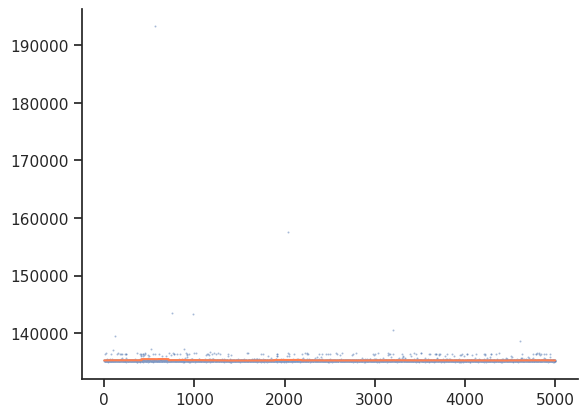

In [7]:
antipode.plotting.plot_loss(losses)

In [8]:
import torch
import pyro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
from pyro.infer import Predictive

# Assume counts_df, meta_df, t, N, species_of, num_species, num_states, model, guide are defined

# 1. Draw posterior samples of parameters
# predictive = Predictive(model, guide=guide, num_samples=20)
# posterior_samples = predictive(t, N, species_of, counts=torch.tensor(counts_df.values, dtype=torch.float))
n_samples = 200
states  = counts_df.columns.tolist()
species = meta_df["species"].astype("category").cat.categories.tolist()

latent_sites = ["mu", "sigma_rise", "sigma_fall", "A",
                "a", "b",  "delta_t","delta_h"]

# container to accumulate draws
posterior_draws = {name: [] for name in latent_sites}

for _ in range(n_samples):
    # trace the guide to get one draw of all of its sample sites
    guide_trace = poutine.trace(guide).get_trace(t, N, species_of, counts)
    for name, node in guide_trace.nodes.items():
        if node["type"] == "sample" and name in latent_sites:
            # detach & move to CPU so we don’t keep gradients or GPU tensors around
            posterior_draws[name].append(node["value"].detach().cpu())

# stack into tensors of shape [n_samples, …]
for name in latent_sites:
    posterior_draws[name] = torch.stack(posterior_draws[name], dim=0)

# Extract posterior mean parameters
mu_post         = posterior_draws["mu"].mean(0).numpy()           # [S]
sigma_rise_post = posterior_draws["sigma_rise"].mean(0).numpy()   # [S]
sigma_fall_post = posterior_draws["sigma_fall"].mean(0).numpy()   # [S]
A_post          = posterior_draws["A"].mean(0).numpy()            # [S]
a_post          = posterior_draws["a"].mean(0).exp().numpy()            # [J]
b_post          = posterior_draws["b"].mean(0).numpy()            # [J]
delta_t_post      = posterior_draws["delta_t"].mean(0).numpy()        # [J, S]
delta_h_post      = posterior_draws["delta_h"].mean(0).numpy()        # [J, S]
rho_post        = torch.softmax(pyro.param('rho_param'),dim=1).detach().cpu().numpy()          # [R, S]

In [9]:
posterior_vars = {}
for l in latent_sites:
    posterior_vars[l] = posterior_draws[l].var(0)

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


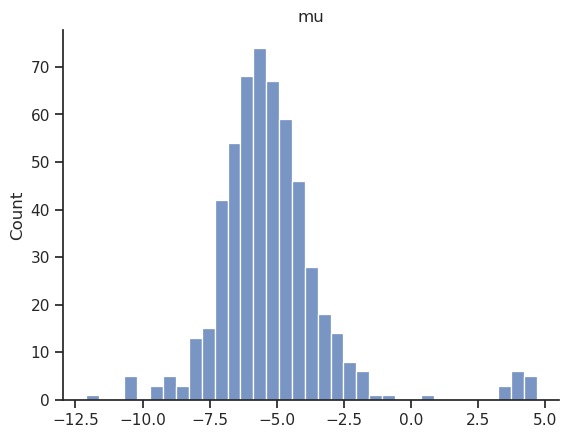

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


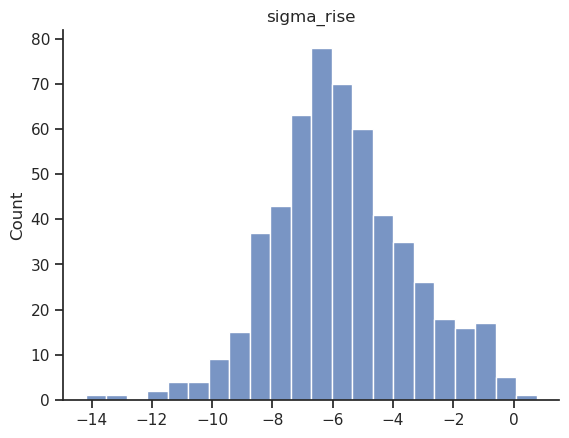

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


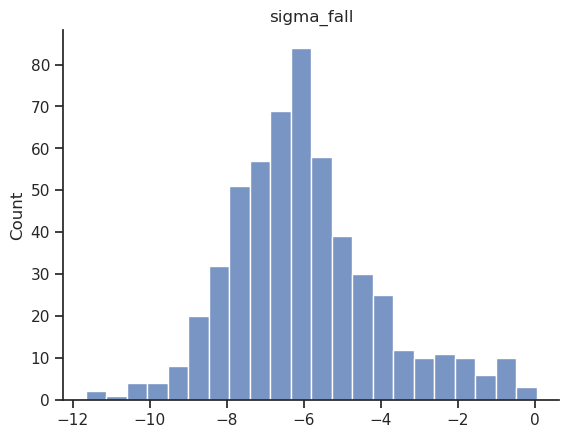

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


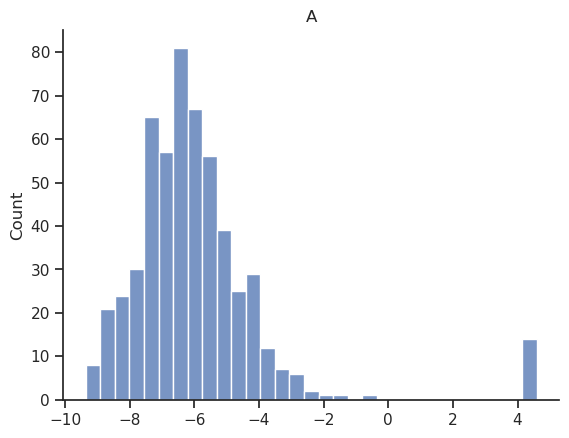

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


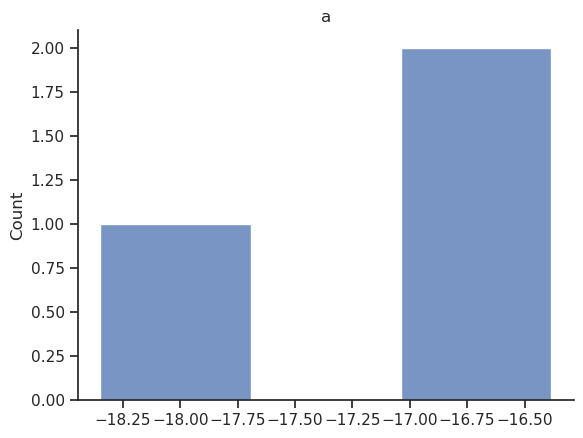

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


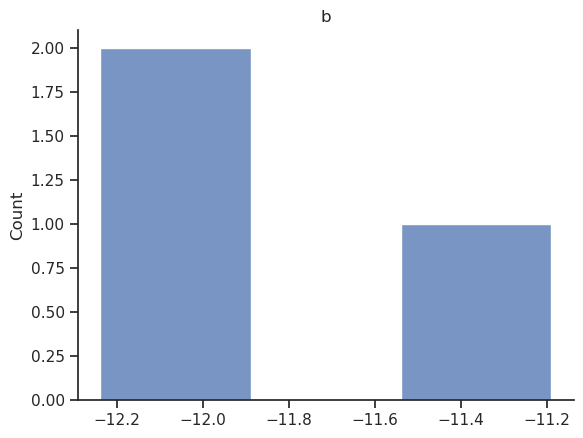

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


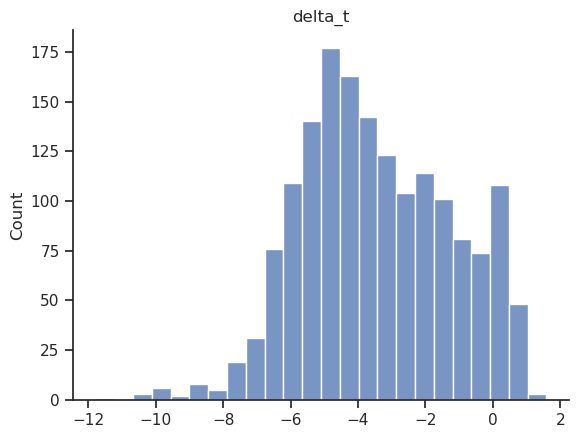

/scratch/fast/1599776/ipykernel_1991497/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


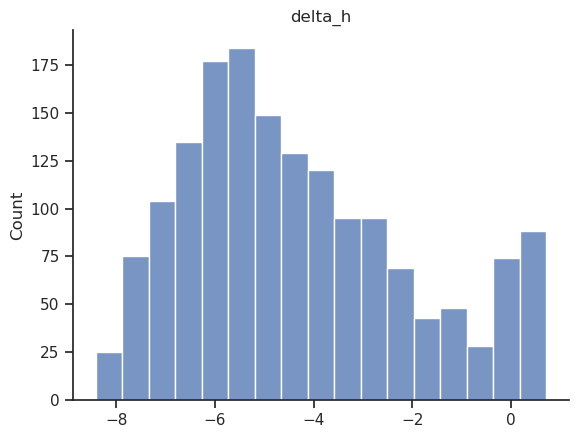

In [10]:
for l in posterior_vars.keys():
    seaborn.histplot(np.log(posterior_vars[l].flatten()))
    plt.title(l)
    plt.show()

In [ ]:
# Per-sample region mixture (from pyro.param)
region_probs = torch.softmax(pyro.param("region_logits"), dim=-1).detach().cpu().numpy()
region_probs_df = pd.DataFrame(region_probs, index=counts_df.index)  # [N, R]

# 2. Plot fitted peak times (mu) for each state
plt.figure(figsize=(8, 4))
plt.bar(states, mu_post)
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Peak time μ")
plt.title("Posterior mean peak times per cell state")
plt.tight_layout()
plt.show()

# 3. Plot rise vs. fall widths
plt.figure(figsize=(6, 6))
plt.scatter(sigma_rise_post, sigma_fall_post)
for i, st in enumerate(states):
    plt.text(sigma_rise_post[i], sigma_fall_post[i], st, fontsize=6)
plt.xlabel("σ_rise")
plt.ylabel("σ_fall")
plt.title("Rise vs Fall widths per cell state")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'rise_fall_scatter.svg'))
plt.show()

# 4. Plot species time-warp parameters
plt.figure(figsize=(6, 4))
plt.scatter(a_post, b_post)
for j, sp in enumerate(species):
    plt.text(a_post[j], b_post[j], sp)
plt.xlabel("Scale a")
plt.ylabel("Shift b")
plt.title("Species time-warp parameters")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'species_warp.svg'))
plt.show()



results = []
regions = meta_df["simplified_region"].unique()
N_arr   = meta_df["total_count"].values
t_raw   = meta_df["timepoint"].values  # raw time

for j, sp in enumerate(species):
    #  5a) compute warped time for every sample of species j
    tau_all = a_post[j] * t_raw + b_post[j]   # shape [N]
    
    #  5b) baseline mixture for every sample
    baseline = region_probs_df.values @ rho_post  # [N, S]

    #  5c) Compute π_pred at each sample’s τ
    #       (we’ll re-use it for both COM and AUC)
    mu_js  = mu_post[None, :] + delta_t_post[j][None, :]  # [1, S] peak locations
    z2     = (tau_all[:, None] - mu_js)**2              # [N, S]
    sigma  = np.where(tau_all[:, None] < mu_js,
                      sigma_rise_post[None, :],
                      sigma_fall_post[None, :])         # [N, S]
    log_time = A_post[None, :] - z2 / (2 * sigma**2)    # [N, S]
    logits   = np.log(baseline + 1e-12) + log_time + delta_h_post[j]     # [N, S]
    pi_pred  = scipy.special.softmax(logits, axis=1)    # [N, S]

    #  5d) sort by tau to prepare for trapezoid
    idx       = np.argsort(tau_all)
    tau_sorted= tau_all[idx]
    pi_sorted = pi_pred[idx, :]                         # [N, S]

    #  5e) compute COM and AUC per state
    weight     = pi_pred * N_arr[:, None]                # [N, S]
    numerator  = (weight * tau_all[:, None]).sum(axis=0)
    denominator= weight.sum(axis=0)
    com_s      = numerator / denominator                 # [S]
    auc_s      = np.trapezoid(pi_sorted, x=tau_sorted, axis=0)  # [S]
    mu_s       = (mu_post + delta_t_post[j])               # [S]

    for s_idx, st in enumerate(states):
        results.append({
            "species":   sp,
            "state":     st,
            "mu":        mu_s[s_idx],
            "com_time":  com_s[s_idx],
            "auc":       auc_s[s_idx],
            "dt":        delta_t_post[j,s_idx],
            "dh":        delta_h_post[j,s_idx],
            "com_realized":       com_s[s_idx]*a_post[j] + b_post[j],
            "mu_realized":       mu_s[s_idx]*a_post[j] + b_post[j],
            
        })

com_df = pd.DataFrame(results)

# Display COM DataFrame to user
print(com_df)

plt.figure(figsize=(12, 6))
seaborn.stripplot(data=com_df, x="state", y="com_time", hue="species")
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Center-of-Mass Time")
plt.title("COM timepoint by state, region, and species")
plt.legend(title="Species")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'model_fit_com.svg'))
plt.show()


plt.figure(figsize=(12, 6))
seaborn.stripplot(data=com_df, x="state", y="mu", hue="species")
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("mu Time")
plt.title("mu by state, region, and species")
plt.legend(title="Species")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'model_fit_mu.svg'))
plt.show()


plt.figure(figsize=(12,6))
seaborn.stripplot(data=com_df, x="state", y="auc", hue="species")
plt.xticks(rotation=90)
plt.ylabel("Area Under Curve")
plt.title("AUC of fitted progression per state and species")
plt.legend(title="Species", bbox_to_anchor=(1.05,1), loc="upper left")
plt.ylim((0,1))
plt.tight_layout()
plt.show()

In [12]:
com_df['Initial_Class'] = com_df['state'].str.split('_[0-9]+__',regex=True).str[0]
com_df['region'] = com_df['state'].str.split('_[0-9]+__',regex=True).str[1]


In [13]:
stat = 'com_time'

In [14]:
np.quantile(com_df[stat],.05)

np.float64(7.293424991003553)

     species                   state         mu   com_time       auc  \
0      human  Astro-Bergmann_167__HB  15.003866  23.675381  0.188478   
1      human  Astro-Bergmann_181__HB  21.887260  21.026757  0.074204   
2      human  Astro-Bergmann_290__HB  14.757807  22.801212  0.404213   
3      human  Astro-Bergmann_589__HB  13.825977  21.450915  0.079843   
4      human   Astro-Bergmann_72__HB  14.513431  22.618371  0.217742   
...      ...                     ...        ...        ...       ...   
1633   mouse      Progen_OPC_542__HB  18.985638  19.562848  0.013284   
1634   mouse      Progen_OPC_542__MB  17.416370  31.459337  0.007966   
1635   mouse     Progen_Tany_203__DE   8.956114  14.342978  0.056751   
1636   mouse     Progen_Tany_293__DE  17.059692  16.465101  0.087108   
1637   mouse     Progen_Tany_515__DE   6.349956  14.657049  0.187590   

            dt        dh  com_realized  mu_realized   Initial_Class region  
0     2.362095  6.823068      5.296176     3.474014  Astro

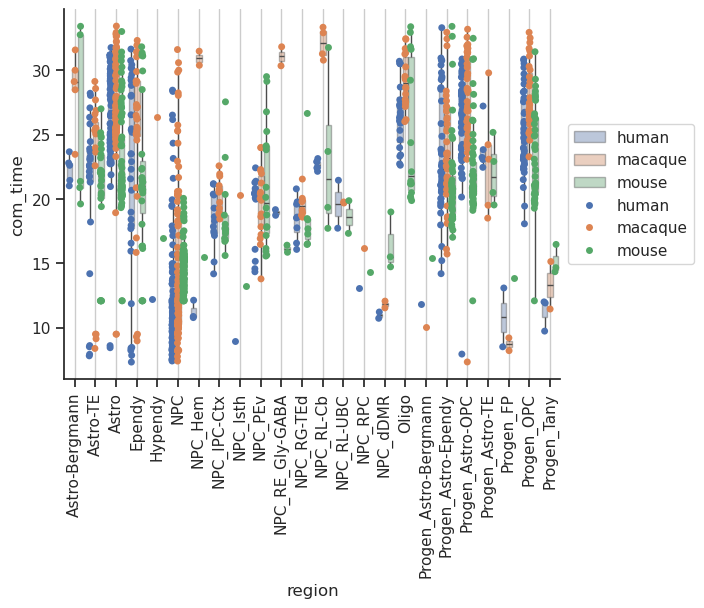

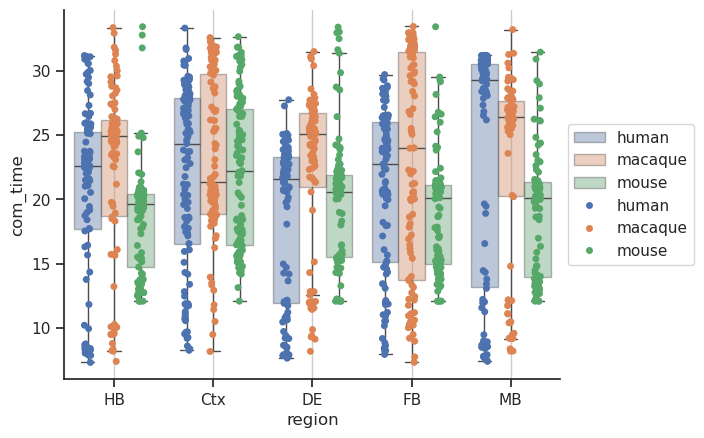

     species                   state         mu   com_time       auc  \
0      human  Astro-Bergmann_167__HB  15.003866  23.675381  0.188478   
1      human  Astro-Bergmann_181__HB  21.887260  21.026757  0.074204   
2      human  Astro-Bergmann_290__HB  14.757807  22.801212  0.404213   
3      human  Astro-Bergmann_589__HB  13.825977  21.450915  0.079843   
4      human   Astro-Bergmann_72__HB  14.513431  22.618371  0.217742   
...      ...                     ...        ...        ...       ...   
1633   mouse      Progen_OPC_542__HB  18.985638  19.562848  0.013284   
1634   mouse      Progen_OPC_542__MB  17.416370  31.459337  0.007966   
1635   mouse     Progen_Tany_203__DE   8.956114  14.342978  0.056751   
1636   mouse     Progen_Tany_293__DE  17.059692  16.465101  0.087108   
1637   mouse     Progen_Tany_515__DE   6.349956  14.657049  0.187590   

            dt        dh  com_realized  mu_realized   Initial_Class region  
0     2.362095  6.823068      5.296176     3.474014  Astro

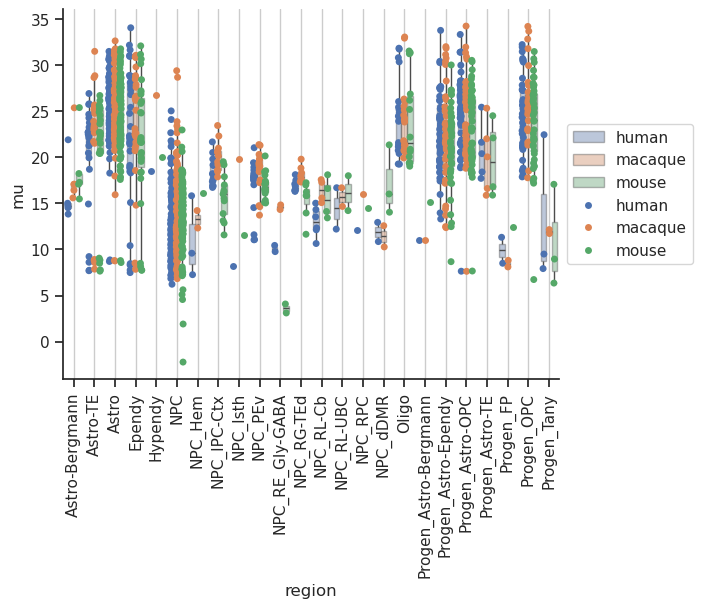

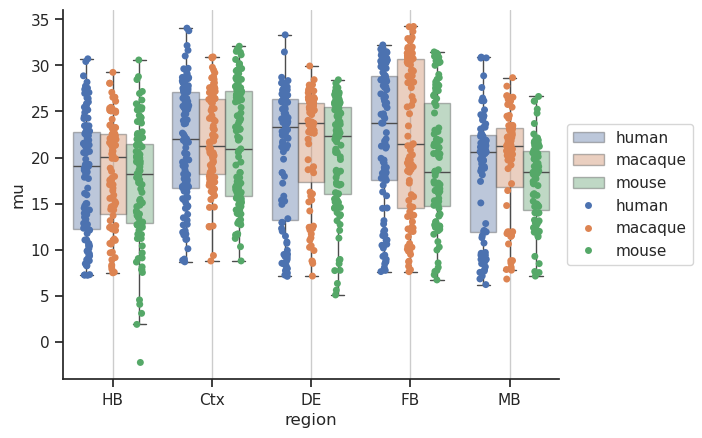

     species                   state         mu   com_time       auc  \
0      human  Astro-Bergmann_167__HB  15.003866  23.675381  0.188478   
1      human  Astro-Bergmann_181__HB  21.887260  21.026757  0.074204   
3      human  Astro-Bergmann_589__HB  13.825977  21.450915  0.079843   
4      human   Astro-Bergmann_72__HB  14.513431  22.618371  0.217742   
5      human       Astro-TE_101__Ctx  22.288445  21.776625  0.000002   
...      ...                     ...        ...        ...       ...   
1633   mouse      Progen_OPC_542__HB  18.985638  19.562848  0.013284   
1634   mouse      Progen_OPC_542__MB  17.416370  31.459337  0.007966   
1635   mouse     Progen_Tany_203__DE   8.956114  14.342978  0.056751   
1636   mouse     Progen_Tany_293__DE  17.059692  16.465101  0.087108   
1637   mouse     Progen_Tany_515__DE   6.349956  14.657049  0.187590   

            dt        dh  com_realized  mu_realized   Initial_Class region  
0     2.362095  6.823068      5.296176     3.474014  Astro

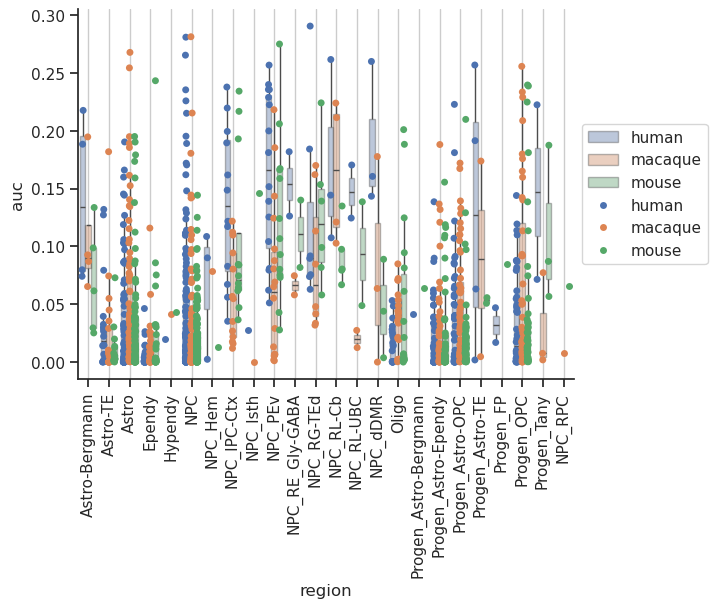

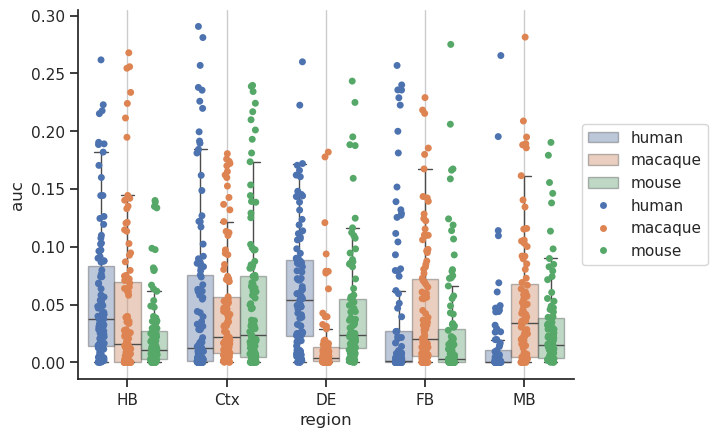

In [15]:
for stat in ['com_time','mu','auc']:
    if stat != 'mu':
        plot_range = (com_df[stat]>np.quantile(com_df[stat],.05))&(com_df[stat]<np.quantile(com_df[stat],.95))
        plot_com_df = com_df.loc[plot_range,:]
    print(plot_com_df)
    # com_df['clipped_stat'] = np.clip(com_df[stat],np.quantile(com_df[stat],.05),np.quantile(com_df[stat],.95))
    ax = seaborn.boxplot(data=plot_com_df,y=stat,x='Initial_Class',hue='species',showfliers=False,boxprops={'alpha': 0.4})
    ax = seaborn.stripplot(data=plot_com_df,y=stat,x='Initial_Class',hue='species',dodge=True)
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    plt.xticks(rotation=90)
    plt.ylabel(stat)
    plt.xlabel('region')
    ax.grid(axis='x')
    plt.show()
    
    
    ax = seaborn.boxplot(data=plot_com_df,y=stat,x='region',hue='species',showfliers=False,boxprops={'alpha': 0.4})
    ax = seaborn.stripplot(data=plot_com_df,y=stat,x='region',hue='species',dodge=True)
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    # plt.xticks(rotation=90)
    plt.ylabel(stat)
    plt.xlabel('region')
    ax.grid(axis='x')
    plt.show()


<Axes: >

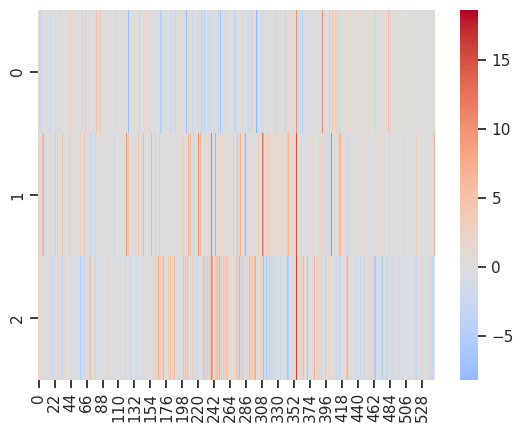

In [16]:
seaborn.heatmap(delta_t_post,cmap='coolwarm',center=0.)

<Axes: >

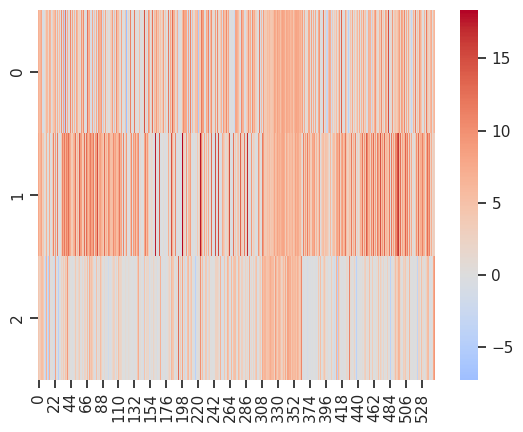

In [17]:
seaborn.heatmap(delta_h_post,cmap='coolwarm',center=0.)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  self._figure.tight_layout(**tight_params)


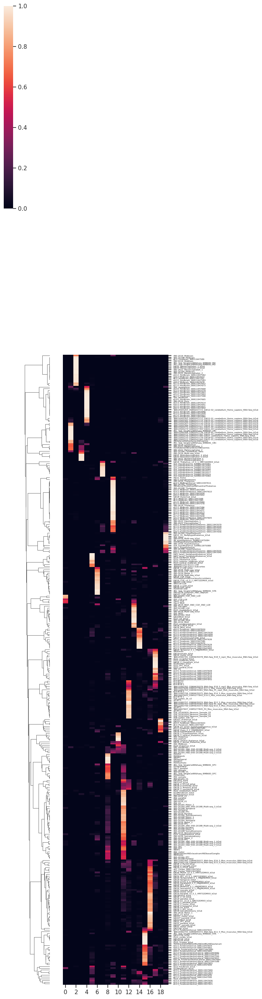

In [18]:
g = seaborn.clustermap(region_probs_df,yticklabels=True,figsize=(5,30),col_cluster=False)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 4)
plt.savefig(os.path.join(sc.settings.figdir,f'fit_region_batch_clustermap.svg'))


In [19]:
counts_pivot_meta['simplified_region'] = counts_pivot_meta['simplified_region'].astype('category')
real_region_oh = antipode.model_functions.numpy_onehot( counts_pivot_meta['simplified_region'].cat.codes)

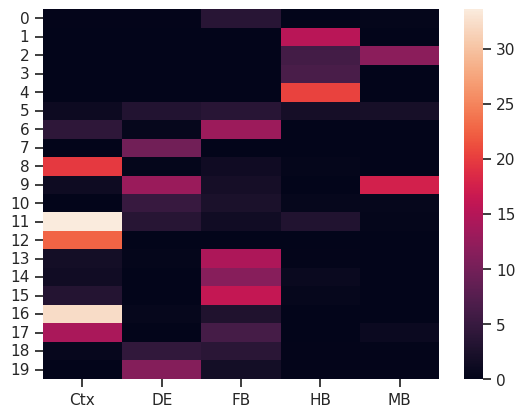

In [20]:
seaborn.heatmap(pd.DataFrame(region_probs_df.T.to_numpy() @ real_region_oh,columns=counts_pivot_meta['simplified_region'].cat.categories))
plt.savefig(os.path.join(sc.settings.figdir,f'fit_region_batch_multiplied_clustermap.svg'))


/scratch/fast/1599776/ipykernel_1991497/1729544151.py:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


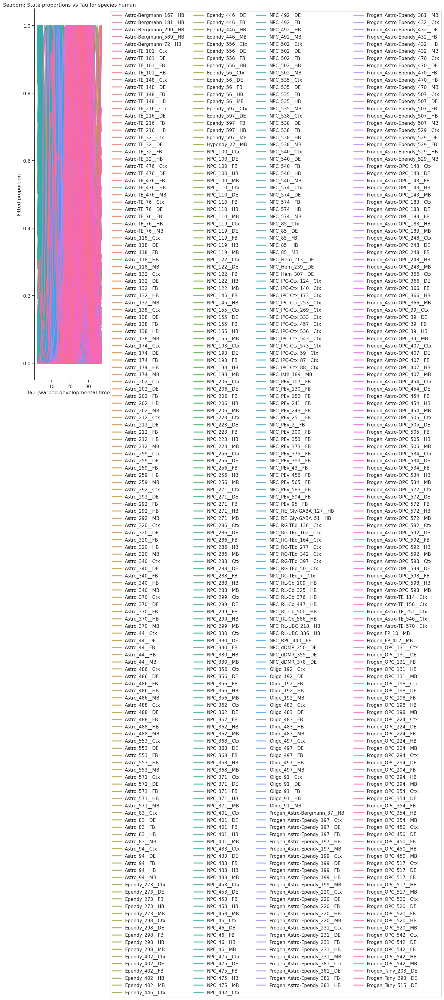

/scratch/fast/1599776/ipykernel_1991497/1729544151.py:67: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None,alpha=0.8)


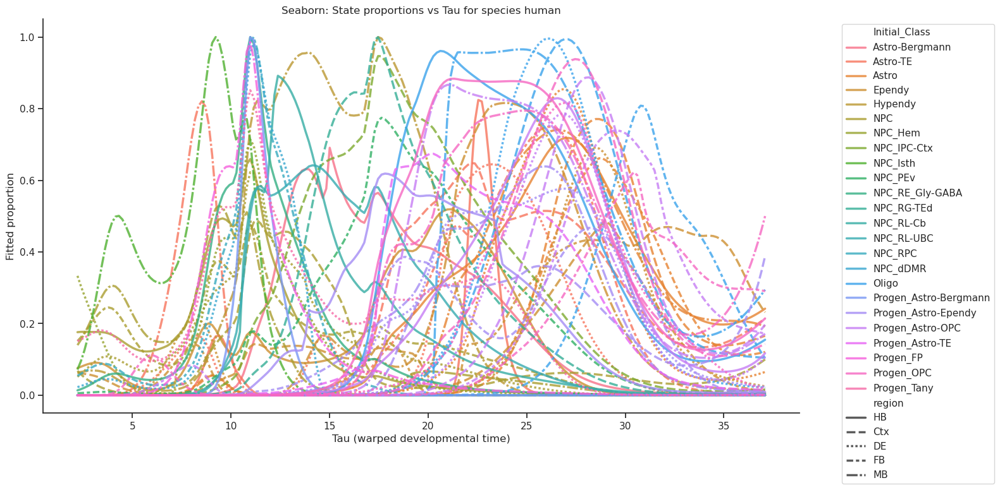

/scratch/fast/1599776/ipykernel_1991497/1729544151.py:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


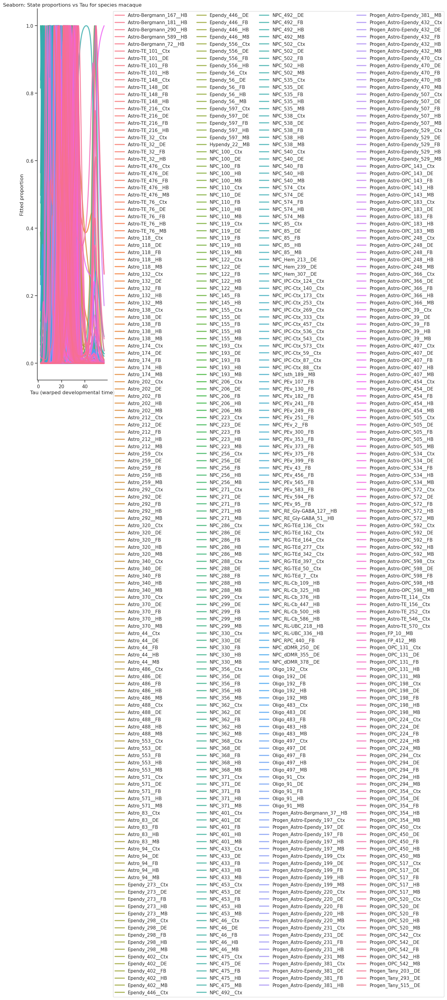

/scratch/fast/1599776/ipykernel_1991497/1729544151.py:67: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None,alpha=0.8)


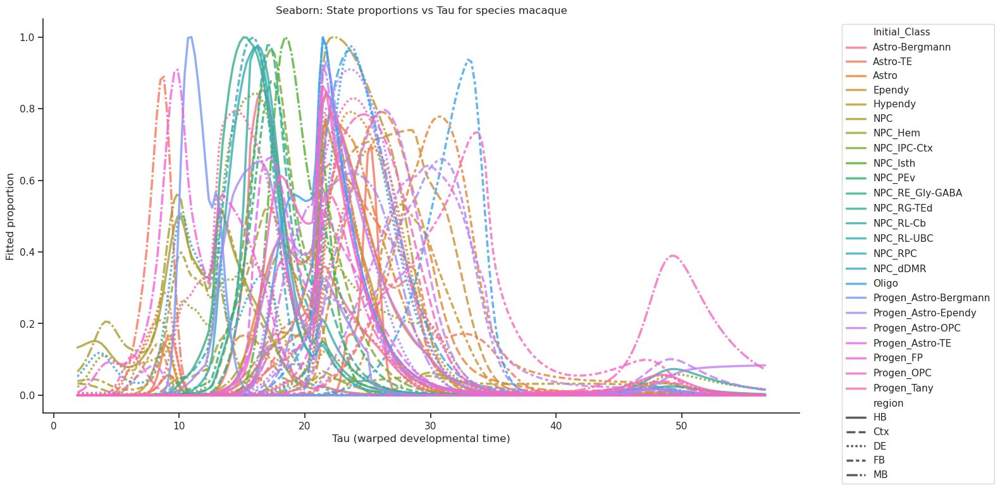

/scratch/fast/1599776/ipykernel_1991497/1729544151.py:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


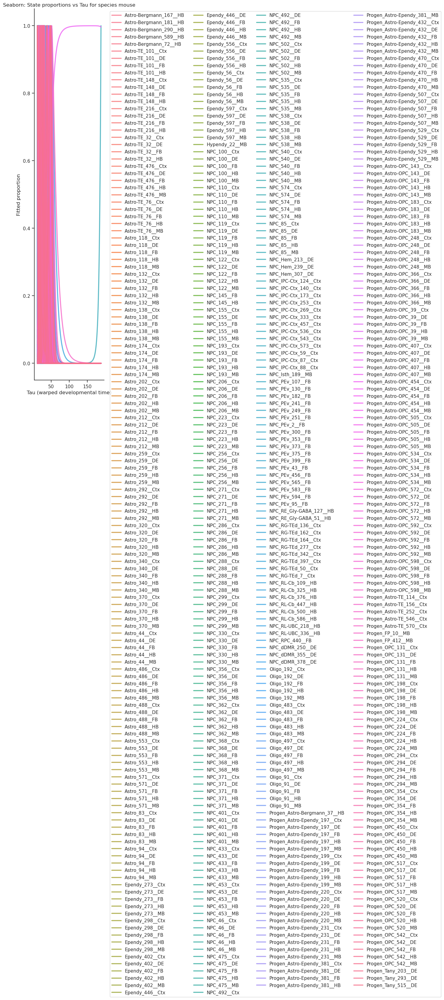

/scratch/fast/1599776/ipykernel_1991497/1729544151.py:67: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None,alpha=0.8)


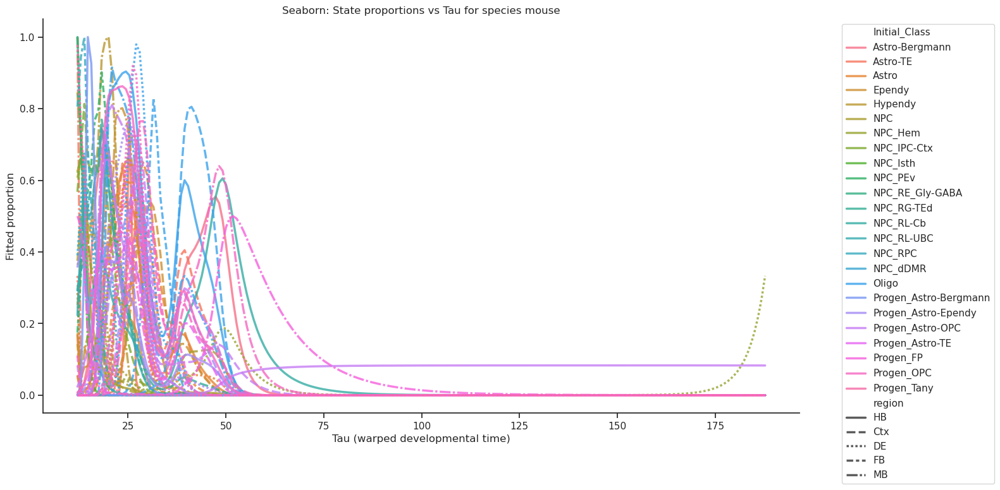

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Assume we have posterior mean parameters mu_post, sigma_rise_post, sigma_fall_post, A_post, a_post, b_post
# Also assume states list, species list, and we focus on one species for clarity (e.g., species index 0)

# Example: Visualize for species 0
for species_idx in range(3):

    # Generate a grid of tau values
    tau_min = t.min().item() * a_post[species_idx] + b_post[species_idx]
    tau_max = t.max().item() * a_post[species_idx] + b_post[species_idx]
    taus = np.linspace(tau_min, tau_max, 200)
    
    # Compute predicted proportions for each state
    pi_preds = []
    for s in range(num_states):
        # piecewise sigma
        mu_s = mu_post[s] + delta_t_post[species_idx,s]
        sigma_rise_s = sigma_rise_post[s]
        sigma_fall_s = sigma_fall_post[s]
        A_s = A_post[s]
        
        # widths for each tau
        sigmas = np.where(taus < mu_s, sigma_rise_s, sigma_fall_s)
        # logits
        logits = A_s - ((taus - mu_s)**2) / (2 * sigmas**2)
        # softmax across states: evaluate all state logits then softmax
        # but for now store logits to compute softmax later
        pi_preds.append(logits)
    
    # Convert logits list to array shape [states, taus]
    logits_arr = np.array(pi_preds)
    
    # Softmax along states axis for each tau
    exp_logits = np.exp(logits_arr - np.max(logits_arr, axis=0))
    proportions = exp_logits / exp_logits.sum(axis=0)
    
    
    # Plotting with Seaborn (long-form DataFrame)
    df_list = []
    for s, state in enumerate(states):
        df_list.append(pd.DataFrame({
            "tau": taus,
            "proportion": proportions[s, :]/proportions[s, :].max(),
            "state": state
        }))
    df_pred = pd.concat(df_list, ignore_index=True)
    df_pred['region'] = df_pred['state'].str.split('__').str[1]
    df_pred['Initial_Class'] = df_pred['state'].str.split('_[0-9]+__',regex=True).str[0]
    
    plt.figure(figsize=(3, 16))
    sns.lineplot(data=df_pred, x="tau", y="proportion", hue="state", linewidth=2.5,alpha=0.8)
    plt.xlabel("Tau (warped developmental time)")
    plt.ylabel("Fitted proportion")
    plt.title(f"Seaborn: State proportions vs Tau for species {species[species_idx]}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',ncol=4)
    plt.tight_layout()
    plt.savefig(os.path.join(sc.settings.figdir,f'{species[species_idx]}_type_progression.svg'))
    plt.show()
    
    plt.figure(figsize=(16, 8))
    sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None,alpha=0.8)
    plt.xlabel("Tau (warped developmental time)")
    plt.ylabel("Fitted proportion")
    plt.title(f"Seaborn: State proportions vs Tau for species {species[species_idx]}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(sc.settings.figdir,f'{species[species_idx]}_region_type_progression.svg'))
    plt.show()


In [22]:
# import os
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn
# import scanpy as sc

# # — assume mu_post, sigma_rise_post, sigma_fall_post,
# #    A_post, a_post, b_post, delta_t_post, states, species, num_states, and t exist —

# all_dfs = []
# for i, sp in enumerate(species):
#     tau_min = 0#t.min().item() * a_post[i] + b_post[i]
#     tau_max = 20#t.max().item() * a_post[i] + b_post[i]
#     taus = np.linspace(tau_min, tau_max, 200)

#     # compute logits & softmax
#     logits = []
#     for s in range(num_states):
#         mu_s = mu_post[s] + delta_t_post[i, s]
#         sig_r = sigma_rise_post[s]
#         sig_f = sigma_fall_post[s]
#         σs = np.where(taus < mu_s, sig_r, sig_f)
#         logits.append(A_post[s] - ((taus - mu_s) ** 2) / (2 * σs**2))
#     logits = np.array(logits) + delta_h_post[i, s]
#     ex = np.exp(logits - logits.max(axis=0))
#     props = ex / ex.sum(axis=0)

#     df_list = []
#     for s, st in enumerate(states):
#         df_list.append(pd.DataFrame({
#             "tau": taus,
#             "proportion": props[s] / props[s].max(),
#             "state": st
#         }))
#     df = pd.concat(df_list, ignore_index=True)
#     df["region"]   = df["state"].str.split("__", expand=True)[1]
#     df["Initial_Class"] = df["state"].str.split("_[0-9]+__", regex=True, expand=True)[0]
#     df["species"]  = sp
#     all_dfs.append(df)

# df_all = pd.concat(all_dfs, ignore_index=True)

# df_all['region'] = df_all['region'].astype('category')
# df_all['region'] = df_all['region'].cat.reorder_categories(['HB','MB','DE','FB','Ctx'])

# # build the grid, sharing both axes via facet_kws
# g = seaborn.relplot(
#     data=df_all,
#     x="tau", y="proportion",
#     kind="line",
#     hue="Initial_Class",
#     row="species",
#     col="region",
#     height=3.5,
#     aspect=1.2,
#     facet_kws=dict(sharex=True, sharey=True),
#     linewidth=2.0
# )

# g.set(xlim=(0, 20))
# g.set_axis_labels("Tau (warped developmental time)", "Fitted proportion")
# g.add_legend(bbox_to_anchor=(1.10, 1), loc="upper left", ncol=2)
# plt.tight_layout()
# plt.savefig(os.path.join(sc.settings.figdir, "state_progression_grid.svg"))
# plt.show()


In [23]:
out_path = '/home/matthew.schmitz/Matthew/data/taxtest/annotations/composition_model/'

In [24]:
## Save params
pstore = pyro.get_param_store()
pstore.save(os.path.join(out_path,'composition_model_param_store.pstore'))
arrays = {
    'mu_post': mu_post,
    'sigma_rise_post': sigma_rise_post,
    'sigma_fall_post': sigma_fall_post,
    'A_post': A_post,
    'a_post': a_post,
    'b_post': b_post,
    'delta_t_post': delta_t_post,
    'delta_h_post': delta_h_post,
    'rho_post': rho_post,
    'region_probs': region_probs,
}

for name, arr in arrays.items():
    np.save(os.path.join(out_path,f'{name}.npy'), arr)

com_df.to_csv(os.path.join(out_path,'model_fit_com_df.tsv'),sep='\t')

# Cortex timing model

In [4]:
## Load saved params
out_path = '/home/matthew.schmitz/Matthew/data/taxtest/annotations/composition_model/'
pyro.get_param_store().load(os.path.join(out_path,'composition_model_param_store.pstore'))

param_arrays = {}
arrays = [
    'mu_post',
    'sigma_rise_post',
    'sigma_fall_post',
    'A_post',
    'a_post',
    'b_post',
    'delta_t_post',
    'delta_h_post',
    'rho_post',
    'region_probs'
]

for name in arrays:
    param_arrays[name] = np.load(os.path.join(out_path,f'{name}.npy'))

mu_post,sigma_rise_post,sigma_fall_post,A_post,a_post,b_post,delta_t_post,delta_h_post,rho_post,region_probs = param_arrays.values()

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from scipy.special import softmax

obs_props = (counts_df.values.T / meta_df["total_count"].values).T  # [N, S]

# 3) Prepare region codes and categories
region_series = meta_df["simplified_region"].astype("category")
region_cats   = region_series.cat.categories  # Index of R region names
region_codes  = region_series.cat.codes.values  # [N], values 0..R-1

# 4) Time arrays
t_obs = meta_df["timepoint"].values  # [N]
t_min, t_max = t_obs.min(), t_obs.max()
t_grid = np.linspace(t_min, t_max, 200)  # for smooth fit curves

# 5) Plot per species
# for j, sp in enumerate(species):
#     mask_sp = (species_of.numpy() == j)
#     if not mask_sp.any():
#         continue

#     fig, ax = plt.subplots(figsize=(10, 6))
    
#     # Scatter observed data points for each state
#     for s, state in enumerate(states):
#         ax.scatter(
#             t_obs[mask_sp],
#             obs_props[mask_sp, s],
#             color=f"C{s}",
#             alpha=0.4,
#             label=f"{state} data" if j == 0 else None,
#             s=20
#         )
    
#     # Plot fitted curves for each region
#     for r, region in enumerate(region_cats):
#         # compute region baseline for region r
#         log_rho = np.log(rho_post[r, :] + 1e-12)  # [S]
        
#         # compute fit curve in real time for species j, region r
#         tau_grid = a_post[j] * t_grid + b_post[j]     # [200]
#         mu = mu_post[None, :] + delta_t_post[j][None, :]
#         z2 = (tau_grid[:, None] - mu) ** 2    # [200, S]
#         sigma = np.where(
#             tau_grid[:, None] < mu,
#             sigma_rise_post[None, :],
#             sigma_fall_post[None, :]
#         )                                                  # [200, S]
#         log_time = A_post[None, :] - z2 / (2 * sigma**2)    # [200, S]
        
#         # combine with region baseline
#         logits = log_rho[None, :] + log_time + delta_h_post[j][None, :]               # [200, S]
#         pi_curve = softmax(logits, axis=1)                  # [200, S]
        
#         # plot each state's fit line (dashed)
#         for s, state in enumerate(states):
#             ax.plot(
#                 t_grid,
#                 pi_curve[:, s],
#                 color=f"C{s}",
#                 linestyle="--",
#                 alpha=0.8,
#                 label=(f"{state} fit" if r == 0 and j == 0 else None)
#             )
    
#     ax.set_title(f"Species: {sp} — Observed vs Fitted State Proportions by Region")
#     ax.set_xlabel("Real time")
#     ax.set_ylabel("Proportion")
#     ax.set_ylim(0, 1.05)
#     if j == 0:
#         ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8,ncol=4)
#     plt.tight_layout()
#     plt.show()


In [6]:
counts_pivot = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/progenitor_timepoint_counts.tsv',sep='\t',index_col=0)
counts_pivot_meta = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/progenitor_timepoint_counts_meta.tsv',sep='\t',index_col=0)
counts_pivot = counts_pivot.loc[:,~counts_pivot.columns.str.contains('Isth|_FP|_RPC|_Tany|_Hem|Progen_Astro-Bergmann')]


# Regional timing model

Based on the model above, but includes a single regional shift term to see which cortical areas are wholesale shifted forwards or backwards in time.

In [7]:
import h5py
import anndata
with h5py.File('/home/matthew.schmitz/Matthew/models/1.9.1.8.5_Dev_final_600clusters/analysis_inprogress.h5ad') as f:
    obs = anndata.io.read_elem(f['obs'])
    uns = anndata.io.read_elem(f['uns'])

batch_region_dict = obs.groupby('batch_name')['region'].value_counts().unstack().idxmax(1).to_dict()

/scratch/fast/1600582/ipykernel_3273583/2574244238.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_region_dict = obs.groupby('batch_name')['region'].value_counts().unstack().idxmax(1).to_dict()


In [8]:
counts_pivot_meta['region'] = counts_pivot_meta.index.to_series().replace(batch_region_dict)

In [9]:
#Ins|Clau|Temp have less than half the timepoints
#mac2 samples are radically different
keep_regions = counts_pivot_meta['region'].str.contains('Ctx-') & ~counts_pivot_meta['region'].str.contains('Ins|Clau|Temp') & ~counts_pivot_meta.index.str.contains('Mac2') 
counts_pivot = counts_pivot.loc[keep_regions]
counts_pivot_meta = counts_pivot_meta.loc[keep_regions]

In [10]:
counts_pivot = counts_pivot.loc[:,~counts_pivot.columns.str.contains('HB|DE|ME|FB')]
counts_pivot = counts_pivot.loc[:,~counts_pivot.columns.str.contains('PEv')]
counts_pivot = counts_pivot.loc[:,~counts_pivot.columns.str.contains('Ependy|Hypendy')]


In [11]:
cpt = counts_pivot.T
cpt['ic'] = counts_pivot.columns.str.split('_[0-9]+').str[0]
cp_aggr = cpt.groupby('ic').sum().T

In [12]:
merged = pd.merge(counts_pivot_meta.loc[:,['region','timepoint','species']],cp_aggr,'inner',left_index=True,right_index=True)
merged['timepoint'] = merged['timepoint'].astype(int).astype('category')
merged['timepoint'] = merged['timepoint'].cat.reorder_categories(sorted(merged['timepoint'].cat.categories))
merged['region'] = merged['region'].astype('category')
merged['region'] = merged['region'].cat.reorder_categories(['Ctx-PFC','Ctx-MOp','Ctx-Somato','Ctx-Par','Ctx-Occ'])


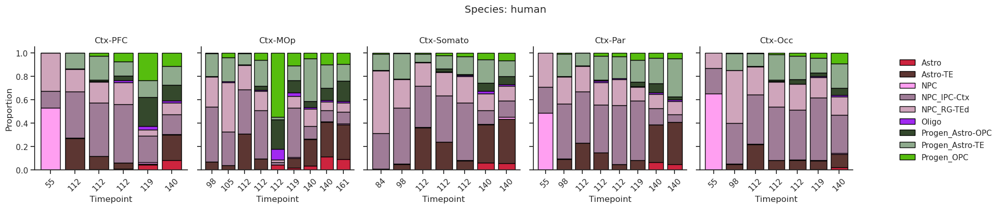

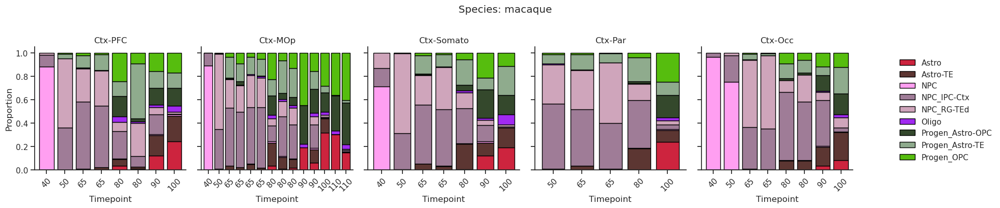

In [13]:
import matplotlib.pyplot as plt

# assume `merged` is your merged DataFrame
cell_types = [c for c in merged.columns if c not in ('region','timepoint','species')]

for sp, df_sp in merged.groupby('species', sort=False):
    regions = df_sp['region'].cat.categories
    n = len(regions)

    fig, axes = plt.subplots(1, n, figsize=(4*n, 4), sharey=True)
    if n == 1:
        axes = [axes]
    fig.suptitle(f"Species: {sp}", y=1.02)

    # we’ll grab one axis’s handles & labels for the legend
    legend_handles = None
    legend_labels  = None

    for ax, reg in zip(axes, regions):
        sub = df_sp[df_sp['region'] == reg]
        plot_df = sub.set_index('timepoint')[cell_types]
        # plot_df = plot_df.loc[sorted(plot_df.index),:]
        # normalize rows to sum to 1
        plot_df = plot_df.div(plot_df.sum(axis=1), axis=0)
        plot_df = plot_df.sort_index()
        plot_df = plot_df#.loc[:,['NPC','NPC_RG-TEd','NPC_IPC-Ctx','Progen_Astro-TE','Progen_Astro-Ependy','Progen_Astro-OPC']]
        # draw bars without legend on each
        handles = plot_df.plot.bar(
            ax=ax,
            stacked=True,
            edgecolor='black',
            width=0.8,
            #colormap='tab20',
            color = uns['Initial_Class_colors_dict'],
            legend=False
        ).containers

        # grab handles & labels once
        if legend_handles is None:
            # each container is one cell-type; use its patch and its label
            legend_handles = [c for c in handles]
            legend_labels  = plot_df.columns.tolist()

        ax.set_title(reg)
        ax.set_xlabel('Timepoint')
        if ax is axes[0]:
            ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)

    # adjust layout to make room on the right
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    # place a single legend to the right, centered vertically
    fig.legend(
        legend_handles,
        legend_labels,
        loc='center left',
        bbox_to_anchor=(0.88, 0.5),
        frameon=False
    )
    plt.savefig(os.path.join(sc.settings.figdir,f'{sp}_ctx_stacked_bars.svg'))
    plt.show()


<Axes: ylabel='Count'>

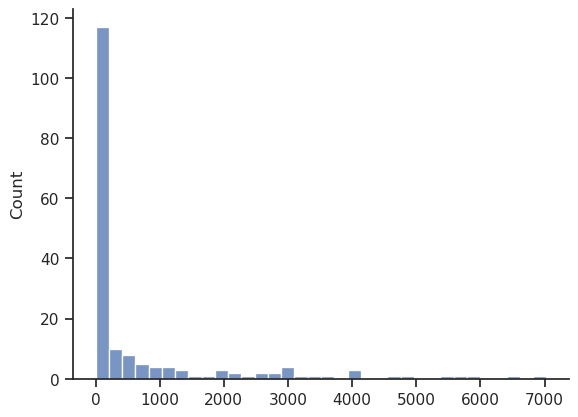

In [14]:
seaborn.histplot(counts_pivot.sum(0))

<Axes: ylabel='Count'>

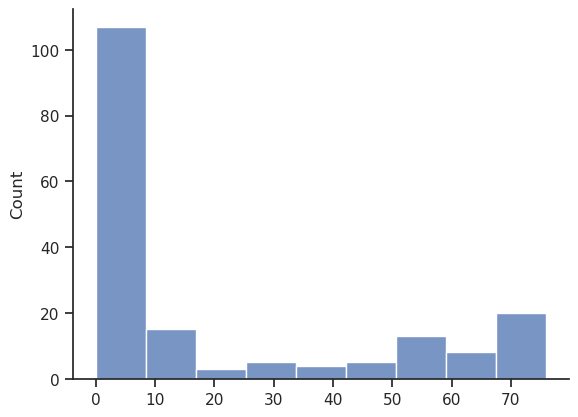

In [15]:
seaborn.histplot((counts_pivot>0).sum(0))

<Axes: ylabel='Count'>

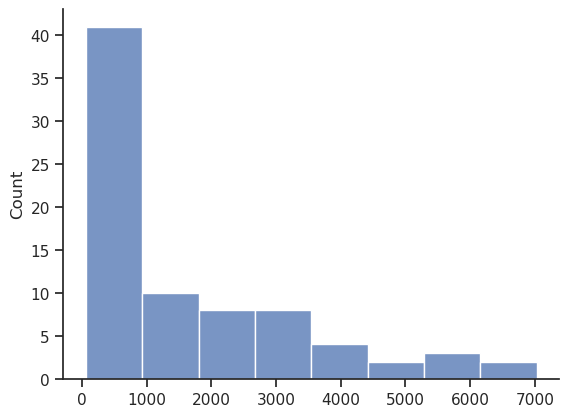

In [16]:
counts_pivot = counts_pivot.loc[:,counts_pivot.sum(0)>50]
counts_pivot = counts_pivot.loc[:,(counts_pivot>0).sum(0)>4]
seaborn.histplot(counts_pivot.sum(0))

In [17]:
n_progenitor_zones = 1

# -- Load and preprocess data --
# Assume counts_pivot and counts_pivot_meta are already loaded pandas DataFrames
samples = counts_pivot.index.intersection(counts_pivot_meta.index)
counts_df = counts_pivot.loc[samples]
meta_df = counts_pivot_meta.loc[samples]
meta_df['region'] = meta_df['region'].astype('category')
meta_df['region'] = meta_df['region'].cat.reorder_categories([ 'Ctx-PFC','Ctx-MOp', 'Ctx-Somato', 'Ctx-Par', 'Ctx-Occ'])

counts = torch.tensor(counts_df.values, dtype=torch.float)
N = torch.tensor(meta_df["total_count"].values, dtype=torch.float)
t = torch.tensor(meta_df["timepoint"].values, dtype=torch.float)
alpha = torch.ones(n_progenitor_zones, dtype=torch.float)#len(meta_df["simplified_region"].unique())+3

species_cat = meta_df["species"].astype("category")
region_cat = meta_df["region"].astype("category")
species_of = torch.tensor(species_cat.cat.codes.values, dtype=torch.long)
real_region_of = torch.tensor(region_cat.cat.codes.values, dtype=torch.long)

num_species = len(species_cat.cat.categories)
num_states = counts.size(1)
num_regions = alpha.shape[0]
num_real_regions = len(meta_df['region'].cat.categories)

a_prior = torch.tensor([1., 166./280.]) #Currently don't think I should use

In [18]:
# def model(t, N, species_of,real_region_of, counts):
#     J, R, S = num_species, num_regions, num_states
#     # learn per‐sample region logits
#     region_logits = pyro.param(
#         "region_logits",
#         torch.zeros(counts.shape[0], R),
#         constraint=dist.constraints.real
#     )
#     region_of = torch.softmax(region_logits, dim=-1)  # [num_samples, R]

#     # 1) species warp
#     σ_a = pyro.sample("sigma_a", dist.HalfCauchy(1.0))
#     σ_b = pyro.sample("sigma_b", dist.HalfCauchy(1.0))
#     with pyro.plate("species", J):
#         a = pyro.sample("a", dist.Normal(0.0, σ_a)).exp()
#         b = pyro.sample("b", dist.Normal(0.0, σ_b))

#     # # 2) region‐baseline simplex
#     # α = torch.ones(S)
#     # with pyro.plate("regions", R):
#     #     rho = pyro.sample("rho", dist.Dirichlet(α))  # [R,S]
#     rho = torch.softmax(pyro.param( #who needs to be fully bayesian?
#         "rho_param",
#         torch.randn(R, S)*0.1,
#     ),dim=1)

    
#     with pyro.plate("dtr", num_real_regions):
#         with pyro.plate('species_3',J):
#             dt_r       = pyro.sample(
#                 "dt_r",
#                 dist.Laplace(0.0, 1.0)
#                 # dist.Laplace(0.0, sigma_delta)
#             )  # [j,s]

#     # 3) unimodal bumps
#     # λ = pyro.sample("lambda_width", dist.HalfCauchy(1.0)) #Probably unnecessary hierarchy prior
#     with pyro.plate("states", S):
#         mu         = pyro.sample("mu",         dist.HalfNormal(10.0))
#         sigma_rise = pyro.sample("sigma_rise", dist.HalfCauchy(1.0))
#         sigma_fall = pyro.sample("sigma_fall", dist.HalfCauchy(1.0))
#         A          = pyro.sample("A",          dist.Normal(0.0, 10.0))

#     with pyro.plate('state_2',S):
#         with pyro.plate('species_2',J):
#             delta_t       = pyro.sample(
#                 "delta_t",
#                 dist.Laplace(0.0, 1.0)
#                 # dist.Laplace(0.0, sigma_delta)
#             )  # [j,s]
#             delta_h       = pyro.sample(
#                 "delta_h",
#                 dist.Laplace(0.0, 1.0)
#             )  # [j,s]
    
#     # 4) data likelihood
#     for i in pyro.plate("data", len(t)):
#         j     = species_of[i]
#         k     = real_region_of[i]
#         τ     = a[j] * t[i] + b[j]               # warped time
#         # time‐bump logit [S]
#         mu_js = mu + delta_t[j] + dt_r[j,k]        # now μ_s + δ_{j,s}
#         z2    = (τ - mu_js)**2
#         σ     = torch.where(τ < mu_js, sigma_rise, sigma_fall)
#         log_time = (A+ delta_h[j]) - z2 / (2*σ**2)

#         log_time = log_time            # delta[j] is [S]

#         # region‐mix logit [S]
#         r_probs  = region_of[i]                  # [R]
#         rho_mix  = r_probs @ rho                 # [S]
#         log_reg  = torch.log(rho_mix + 1e-12)

#         # combine and normalize
#         logits = log_reg + log_time              # [S]
#         pi     = torch.softmax(logits, dim=-1)   # [S]

#         pyro.sample(
#             f"obs_{i}",
#             dist.Multinomial(total_count=int(N[i].item()), probs=pi),
#             obs=counts[i]
#         )
# guide = AutoNormal(model)

od = torch.ones(1,device=device)
def model(t, N, species_of, real_region_of, counts):
    J, R, S = num_species, num_regions, num_states

    # 1) per-sample region logits
    region_logits = pyro.param(
        "region_logits",
        torch.zeros(counts.shape[0], R,device=device),
        constraint=dist.constraints.real
    )
    region_of = torch.softmax(region_logits, dim=-1)  # [N, R]

    # 2) species warp
    σ_a = pyro.sample("sigma_a", dist.HalfCauchy(1.0*od))
    σ_b = pyro.sample("sigma_b", dist.HalfCauchy(1.0*od))
    with pyro.plate("species", J):
        a = pyro.sample("a", dist.Normal(0.0*od, σ_a)).exp()  # [J]
        b = pyro.sample("b", dist.Normal(0.0*od, σ_b))        # [J]

    # 3) region baseline (MAP)
    rho = torch.softmax(
        pyro.param(
            "rho_param",
            torch.randn(R, S,device=device) * 0.1
        ),
        dim=-1
    )  # [R, S]

    # 4) per-species×real-region time shifts
    with pyro.plate("dtr", num_real_regions), pyro.plate("species_3", J):
        dt_r = pyro.sample("dt_r", dist.Laplace(0.0*od, 1.0*od))
        # dt_r has shape [J, num_real_regions]

    # 5) unimodal bump parameters
    with pyro.plate("states", S):
        mu         = pyro.sample("mu",         dist.HalfNormal(10.0*od))
        sigma_rise = pyro.sample("sigma_rise", dist.HalfNormal(1.0*od))
        sigma_fall = pyro.sample("sigma_fall", dist.HalfNormal(1.0*od))
        A          = pyro.sample("A",          dist.Normal(0.0*od, 10.0*od))

    # 6) species×state offsets
    with pyro.plate("state_2", S), pyro.plate("species_2", J):
        delta_t = pyro.sample("delta_t", dist.Laplace(0.0*od, 1.0*od))  # [J, S]
        delta_h = pyro.sample("delta_h", dist.Laplace(0.0*od, 1.0*od))  # [J, S]

    # ───────────── vectorized data likelihood ─────────────
    with pyro.plate("data", len(t)):
        # index arrays of shape [N]
        j = species_of            # species index per sample
        k = real_region_of        # real-region index per sample

        # 1) warped time [N]
        τ = a[j] * t + b[j]       # broadcasts: [J][j] * [N] + [J][j] → [N]

        # 2) per-species/state + region shift of the peak → [N, S]
        #    mu: [S] → [N,S], delta_t[j]: [N,S], dt_r[j,k]: [N] → broadcast to [N,S]
        mu_js = mu[None, :] \
              + delta_t[j] \
              + dt_r[j, k][:, None]

        # 3) half-gaussian squared distance & piecewise width → [N,S]
        z2    = (τ.unsqueeze(-1) - mu_js)**2
        σ     = torch.where(
                    τ.unsqueeze(-1) < mu_js,
                    sigma_rise,    # [S] → [N,S]
                    sigma_fall     # [S] → [N,S]
                )

        # 4) bump log-odds → [N,S]
        #    A: [S] → [N,S], delta_h[j]: [N,S]
        log_time = (A[None, :] + delta_h[j]) \
                   - z2 / (2 * σ**2)

        # 5) region mixture log-odds → [N,S]
        rho_mix = region_of @ rho                  # matrix-multiply [N,R]×[R,S] → [N,S]
        log_reg = torch.log(rho_mix + 1e-12)       # [N,S]

        # 6) final state logits & probabilities → [N,S]
        logits = log_reg + log_time
        pi     = torch.softmax(logits, dim=-1)

        # 7) exact per-sample totals via Poisson surrogate (vectorized)
        rate = (N.unsqueeze(-1) * pi).clamp(min=1e-6)  # [N,S]
        pyro.sample(
            "obs",
            dist.Poisson(rate).to_event(1),
            obs=counts
        )



In [19]:
pyro.clear_param_store()
guide = AutoNormal(model)
guide.to(device)

optimizer = ClippedAdam({"lr": 2e-2})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

t, N, species_of,real_region_of, counts = t.to(device), N.to(device), species_of.to(device),real_region_of.to(device), counts.to(device)

# fitting loop
losses = []
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of,real_region_of, counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")


optimizer = ClippedAdam({"lr": 5e-3})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())


# fitting loop
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of,real_region_of,counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 1e-3})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())


# fitting loop
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of,real_region_of,counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

optimizer = ClippedAdam({"lr": 2e-4})
svi = SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())


# fitting loop
for step in tqdm.tqdm(range(5000)):
    loss = svi.step(t, N, species_of,real_region_of,counts)
    losses.append(loss)
    if step % 500 == 0:
        print(f"[{step}] ELBO = {-loss:.1f}")

  0%|          | 6/5000 [00:16<2:52:14,  2.07s/it] 

[0] ELBO = -2295943.7


 10%|█         | 506/5000 [00:28<01:45, 42.58it/s] 

[500] ELBO = -87187.4


 20%|██        | 1006/5000 [00:40<01:33, 42.56it/s]

[1000] ELBO = -33890.9


 30%|███       | 1506/5000 [00:52<01:23, 41.87it/s]

[1500] ELBO = -32948.6


 40%|████      | 2006/5000 [01:03<01:10, 42.60it/s]

[2000] ELBO = -32785.7


 50%|█████     | 2506/5000 [01:15<00:58, 42.50it/s]

[2500] ELBO = -32803.8


 60%|██████    | 3006/5000 [01:27<00:46, 42.56it/s]

[3000] ELBO = -32877.6


 70%|███████   | 3506/5000 [01:39<00:35, 42.58it/s]

[3500] ELBO = -32668.7


 80%|████████  | 4006/5000 [01:51<00:23, 42.30it/s]

[4000] ELBO = -32624.2


 90%|█████████ | 4508/5000 [02:03<00:11, 42.65it/s]

[4500] ELBO = -32681.2


  0%|          | 5/5000 [00:00<01:57, 42.53it/s]

[0] ELBO = -32584.0


 10%|█         | 505/5000 [00:11<01:45, 42.55it/s]

[500] ELBO = -32266.7


 20%|██        | 1005/5000 [00:23<01:33, 42.74it/s]

[1000] ELBO = -32238.0


 30%|███       | 1505/5000 [00:35<01:21, 42.83it/s]

[1500] ELBO = -32238.0


 40%|████      | 2005/5000 [00:47<01:09, 42.81it/s]

[2000] ELBO = -32202.7


 50%|█████     | 2505/5000 [00:58<00:58, 42.92it/s]

[2500] ELBO = -32293.1


 60%|██████    | 3005/5000 [01:10<00:46, 42.92it/s]

[3000] ELBO = -32134.9


 70%|███████   | 3505/5000 [01:22<00:34, 42.83it/s]

[3500] ELBO = -32316.3


 80%|████████  | 4005/5000 [01:34<00:23, 42.92it/s]

[4000] ELBO = -32204.4


 90%|█████████ | 4509/5000 [01:46<00:11, 43.06it/s]

[4500] ELBO = -32163.4


  0%|          | 5/5000 [00:00<01:56, 42.81it/s]

[0] ELBO = -32169.5


 10%|█         | 505/5000 [00:11<01:44, 43.16it/s]

[500] ELBO = -32080.0


 20%|██        | 1005/5000 [00:23<01:32, 43.02it/s]

[1000] ELBO = -32108.2


 30%|███       | 1505/5000 [00:34<01:21, 43.15it/s]

[1500] ELBO = -32104.4


 40%|████      | 2005/5000 [00:46<01:09, 43.23it/s]

[2000] ELBO = -32048.9


 50%|█████     | 2505/5000 [00:58<00:57, 43.17it/s]

[2500] ELBO = -32125.8


 60%|██████    | 3005/5000 [01:09<00:46, 43.21it/s]

[3000] ELBO = -32094.0


 70%|███████   | 3505/5000 [01:21<00:34, 43.24it/s]

[3500] ELBO = -32120.0


 80%|████████  | 4005/5000 [01:33<00:23, 42.18it/s]

[4000] ELBO = -32108.6


 90%|█████████ | 4507/5000 [01:44<00:11, 42.26it/s]

[4500] ELBO = -32079.4


  0%|          | 5/5000 [00:00<01:56, 42.95it/s]

[0] ELBO = -32070.6


 10%|█         | 505/5000 [00:11<01:43, 43.26it/s]

[500] ELBO = -32043.1


 20%|██        | 1005/5000 [00:23<01:33, 42.92it/s]

[1000] ELBO = -32070.3


 30%|███       | 1505/5000 [00:34<01:20, 43.22it/s]

[1500] ELBO = -32032.4


 40%|████      | 2005/5000 [00:46<01:09, 43.13it/s]

[2000] ELBO = -32094.0


 50%|█████     | 2505/5000 [00:58<01:03, 39.43it/s]

[2500] ELBO = -32026.1


 60%|██████    | 3005/5000 [01:09<00:46, 43.13it/s]

[3000] ELBO = -32079.3


 70%|███████   | 3505/5000 [01:21<00:34, 43.23it/s]

[3500] ELBO = -32115.0


 80%|████████  | 4005/5000 [01:33<00:23, 43.25it/s]

[4000] ELBO = -32061.7


 90%|█████████ | 4505/5000 [01:44<00:11, 43.22it/s]

[4500] ELBO = -32041.7


100%|██████████| 5000/5000 [01:56<00:00, 43.01it/s]


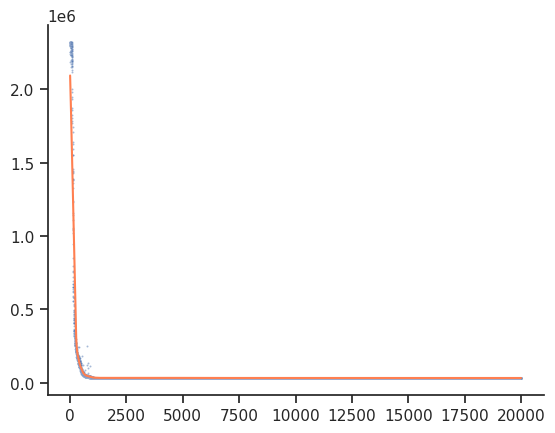

In [20]:
antipode.plotting.plot_loss(losses)

In [21]:
import torch
import pyro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
from pyro.infer import Predictive

# Assume counts_df, meta_df, t, N, species_of, num_species, num_states, model, guide are defined

# 1. Draw posterior samples of parameters
# predictive = Predictive(model, guide=guide, num_samples=20)
# posterior_samples = predictive(t, N, species_of, counts=torch.tensor(counts_df.values, dtype=torch.float))
n_samples = 200
states  = counts_df.columns.tolist()
species = meta_df["species"].astype("category").cat.categories.tolist()

latent_sites = ["mu", "sigma_rise", "sigma_fall", "A",
                "a", "b", "delta_t","delta_h","dt_r"]

# container to accumulate draws
posterior_draws = {name: [] for name in latent_sites}

for _ in range(n_samples):
    # trace the guide to get one draw of all of its sample sites
    guide_trace = poutine.trace(guide).get_trace(t, N, species_of, counts)
    for name, node in guide_trace.nodes.items():
        if node["type"] == "sample" and name in latent_sites:
            # detach & move to CPU so we don’t keep gradients or GPU tensors around
            posterior_draws[name].append(node["value"].detach().cpu())

# stack into tensors of shape [n_samples, …]
for name in latent_sites:
    posterior_draws[name] = torch.stack(posterior_draws[name], dim=0)

# Extract posterior mean parameters
mu_post         = posterior_draws["mu"].mean(0).numpy()           # [S]
sigma_rise_post = posterior_draws["sigma_rise"].mean(0).numpy()   # [S]
sigma_fall_post = posterior_draws["sigma_fall"].mean(0).numpy()   # [S]
A_post          = posterior_draws["A"].mean(0).numpy()            # [S]
a_post          = posterior_draws["a"].mean(0).exp().numpy()            # [J]
b_post          = posterior_draws["b"].mean(0).numpy()            # [J]
delta_t_post      = posterior_draws["delta_t"].mean(0).numpy()        # [J, S]
delta_h_post      = posterior_draws["delta_h"].mean(0).numpy()        # [J, S]
rho_post        = torch.softmax(pyro.param('rho_param'),dim=1).detach().cpu().numpy()          # [R, S]
delta_rt_post      = posterior_draws["dt_r"].mean(0).numpy()        # [J, S]


In [22]:
dfs = []
for i in range(posterior_draws["dt_r"].shape[0]):
    dfs.append(pd.DataFrame(posterior_draws["dt_r"][i,...].numpy(),index=[species_cat.cat.categories],columns=meta_df['region'].cat.categories ))
dr_tab = pd.concat(dfs)

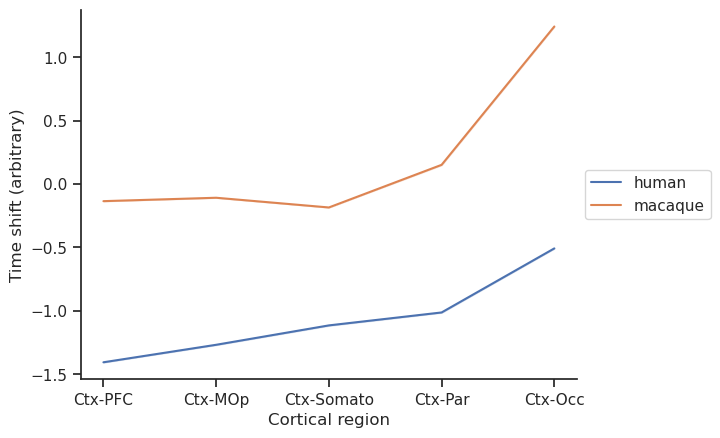

In [23]:
melted_dr_tab = dr_tab.melt(ignore_index=False)
melted_dr_tab['species'] = [x[0] for x in melted_dr_tab.index]
ax = seaborn.lineplot(data=melted_dr_tab,x='variable',y='value',hue='species')
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
plt.xlabel('Cortical region')
plt.ylabel('Time shift (arbitrary)')
plt.savefig(os.path.join(sc.settings.figdir,'ctx_dr_by_region_arbitrary.svg'))
plt.show()


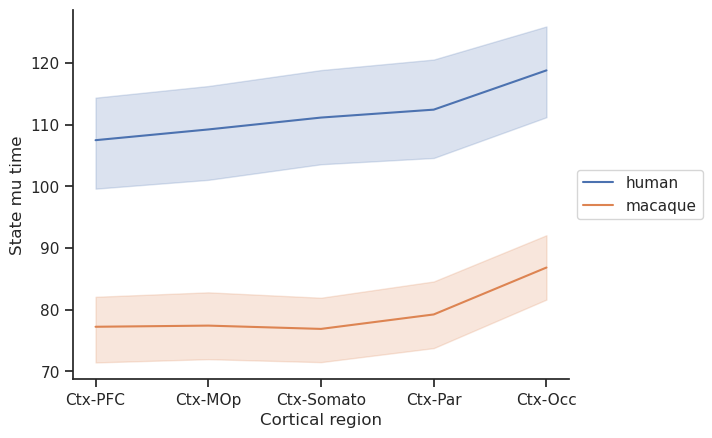

In [24]:
reconst = (delta_rt_post[...,np.newaxis]-b_post[:,np.newaxis,np.newaxis]+delta_t_post[:,np.newaxis,:]+mu_post[np.newaxis,np.newaxis,:])/a_post[:,np.newaxis,np.newaxis]
dfs = []
for i in range(reconst.shape[-1]):
    df = pd.DataFrame(reconst[...,i],index=[species_cat.cat.categories],columns=meta_df['region'].cat.categories )
    df['state'] = i
    dfs.append(df)
dr_tab = pd.concat(dfs)
melted_dr_tab = dr_tab.melt(id_vars = ['state'],ignore_index=False)
melted_dr_tab['species'] = [x[0] for x in melted_dr_tab.index]
ax = seaborn.lineplot(data=melted_dr_tab,x='variable',y='value',hue='species')
# ax = seaborn.scatterplot(data=melted_dr_tab,x='variable',y='value',hue='species')
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
plt.xlabel('Cortical region')
plt.ylabel('State mu time')
plt.savefig(os.path.join(sc.settings.figdir,'ctx_dr_by_region_ci.svg'))
plt.show()



In [25]:
# dfs = []
# for i in range(posterior_draws["dt_r"].shape[0]):
#     dfs.append(pd.DataFrame((posterior_draws["dt_r"][i,...].numpy()-posterior_draws["b"][i,:,np.newaxis].numpy())/posterior_draws["a"][i,:,np.newaxis].exp().numpy(),index=[species_cat.cat.categories],columns=meta_df['region'].cat.categories ))
# dr_tab = pd.concat(dfs)

dr_tab = pd.DataFrame((delta_rt_post-b_post[:,np.newaxis]+delta_t_post.mean(1)[:,np.newaxis]+np.median(mu_post))/a_post[:,np.newaxis],index=[species_cat.cat.categories],columns=meta_df['region'].cat.categories)
dr_tab = dr_tab - dr_tab.min().min() #Looking for absolute shift not full PCD reconstruction

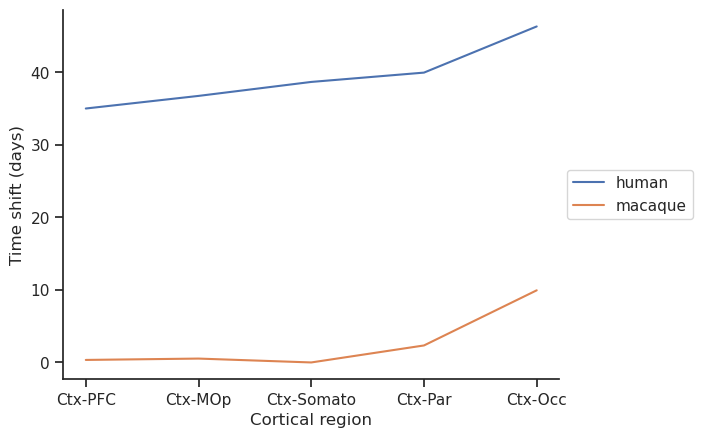

In [26]:
melted_dr_tab = dr_tab.melt(ignore_index=False)
melted_dr_tab['species'] = [x[0] for x in melted_dr_tab.index]
ax = seaborn.lineplot(data=melted_dr_tab,x='variable',y='value',hue='species')
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
plt.xlabel('Cortical region')
plt.ylabel('Time shift (days)')
plt.savefig(os.path.join(sc.settings.figdir,'ctx_dr_by_region.svg'))
plt.show()


In [27]:
posterior_vars = {}
for l in latent_sites:
    posterior_vars[l] = posterior_draws[l].var(0)

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


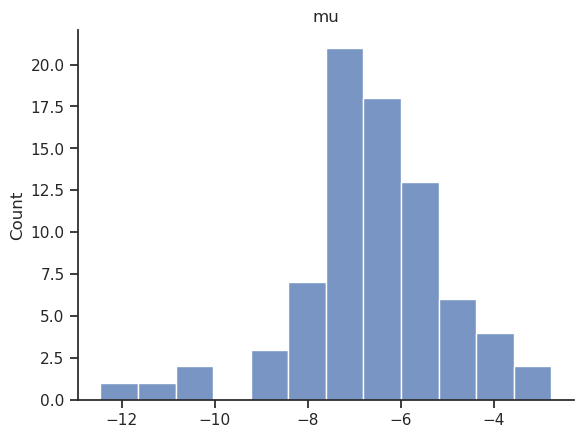

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


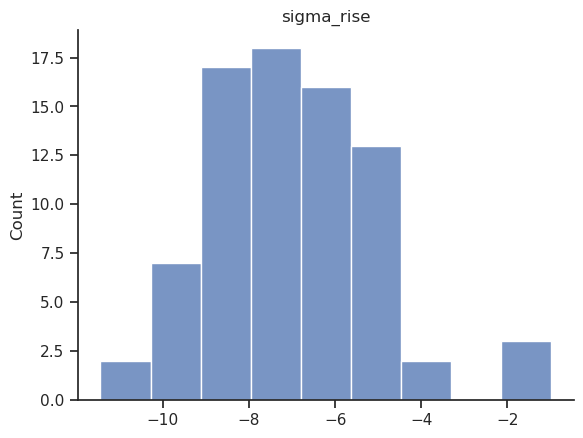

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


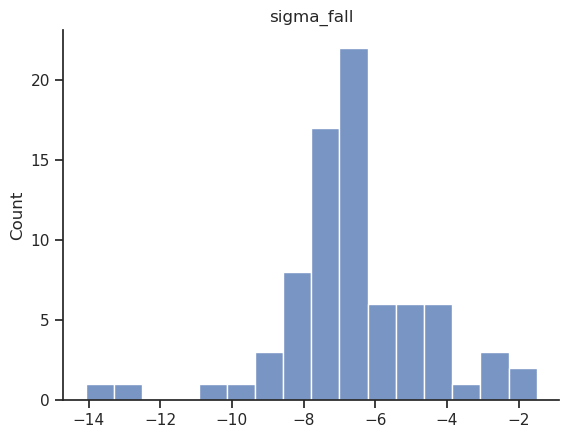

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


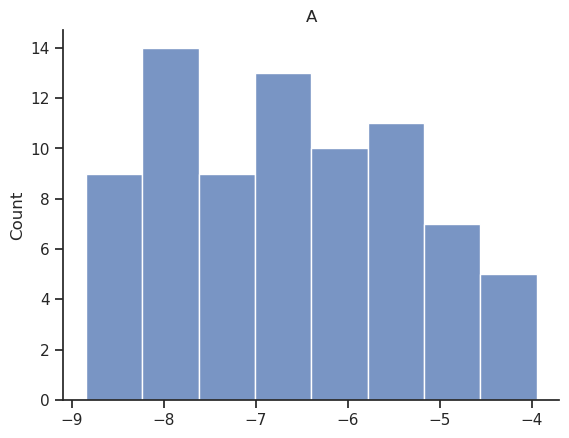

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


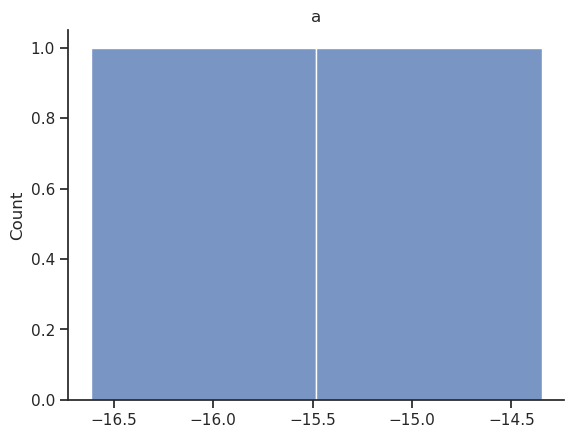

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


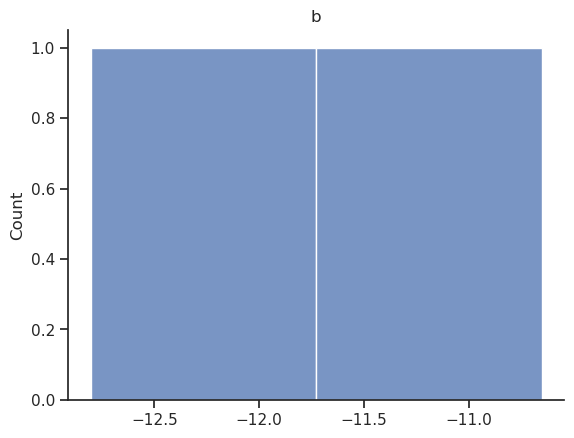

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


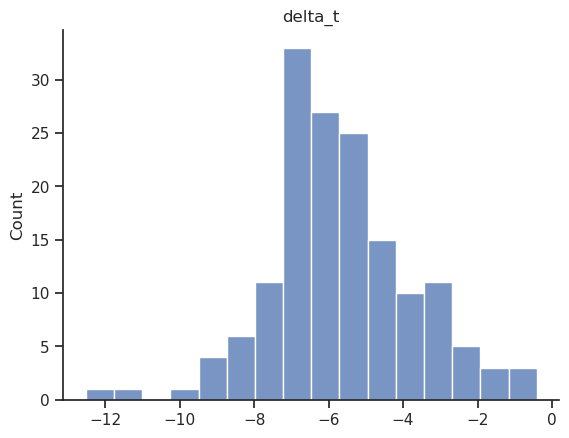

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


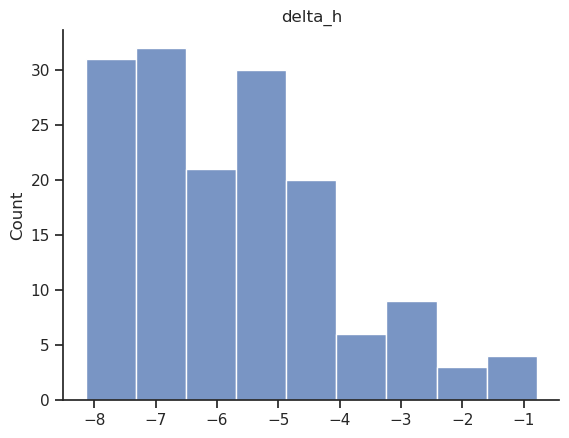

/scratch/fast/1600582/ipykernel_3273583/4262044018.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  seaborn.histplot(np.log(posterior_vars[l].flatten()))


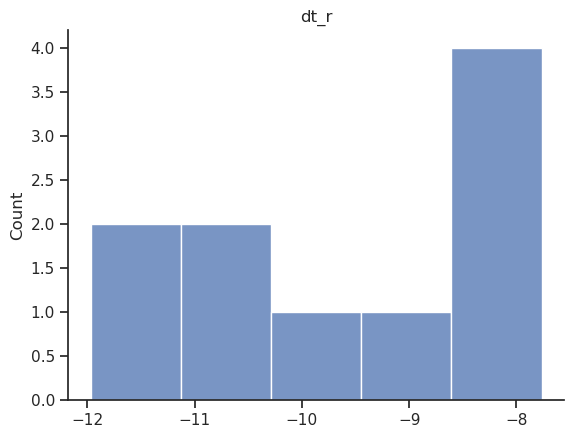

In [28]:
for l in posterior_vars.keys():
    seaborn.histplot(np.log(posterior_vars[l].flatten()))
    plt.title(l)
    plt.show()

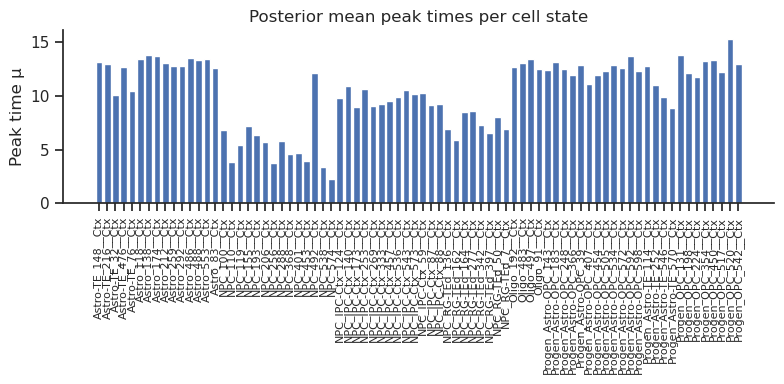

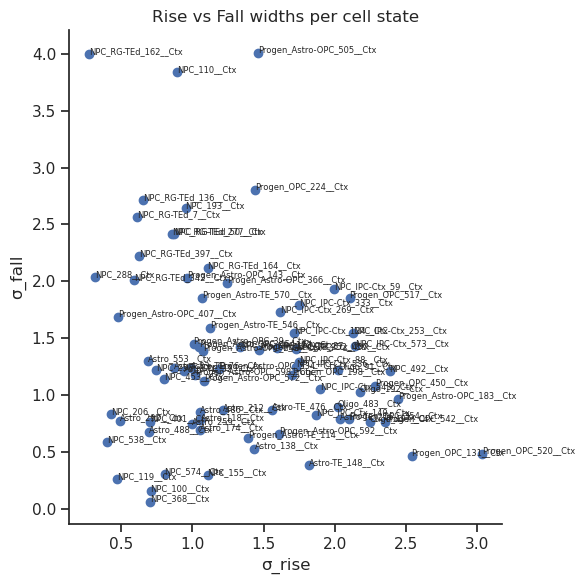

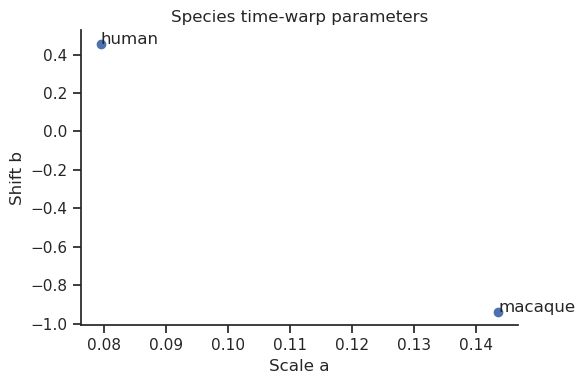

     species                state         mu   com_time       auc        dt  \
0      human    Astro-TE_148__Ctx  13.835855  11.576313  0.301211  0.679899   
1      human    Astro-TE_216__Ctx  12.536496  10.293705  0.255950 -0.427655   
2      human     Astro-TE_32__Ctx  10.087879   9.655052  0.150755  0.009555   
3      human    Astro-TE_476__Ctx  12.565621  11.168859  0.053836 -0.050128   
4      human     Astro-TE_76__Ctx  10.219619   9.748537  0.163280 -0.193837   
..       ...                  ...        ...        ...       ...       ...   
151  macaque  Progen_OPC_354__Ctx  13.215934  12.876196  0.165650 -0.032226   
152  macaque  Progen_OPC_450__Ctx  13.432966  13.826358  0.169219  0.154161   
153  macaque  Progen_OPC_517__Ctx  12.346891  13.761181  0.059192  0.137572   
154  macaque  Progen_OPC_520__Ctx  15.580336  14.811953  0.622131  0.281734   
155  macaque  Progen_OPC_542__Ctx  13.258908  12.624380  0.117757  0.325000   

           dh  com_realized  mu_realized  
0    5.1

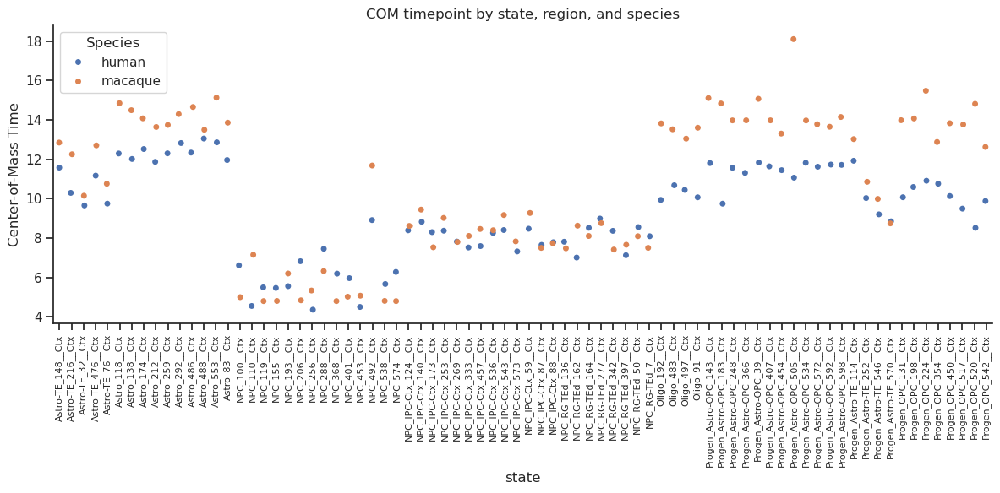

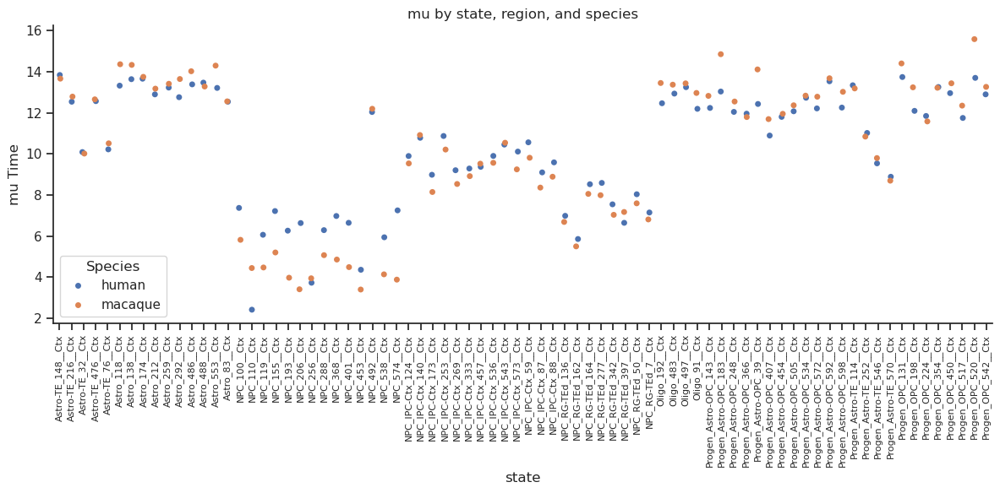

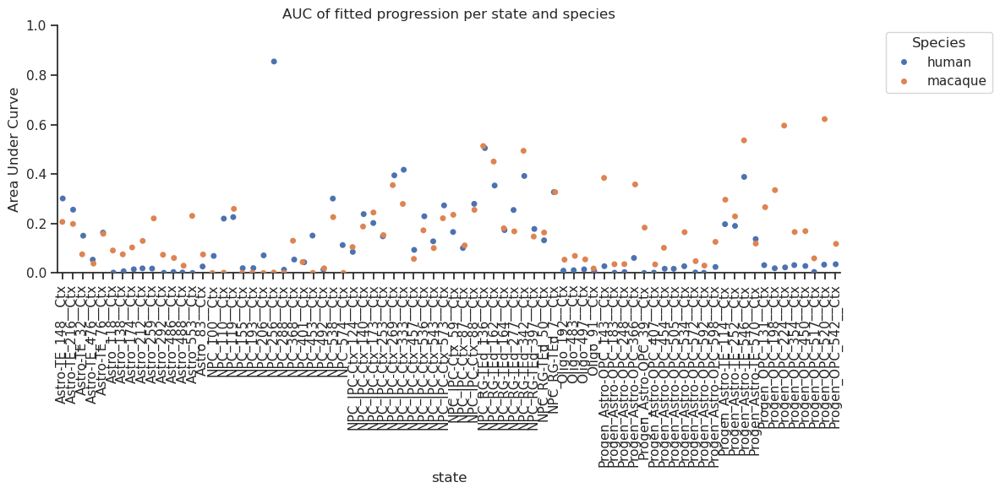

In [29]:
# Per-sample region mixture (from pyro.param)
region_probs = torch.softmax(pyro.param("region_logits"), dim=-1).detach().cpu().numpy()
region_probs_df = pd.DataFrame(region_probs, index=counts_df.index)  # [N, R]

# 2. Plot fitted peak times (mu) for each state
plt.figure(figsize=(8, 4))
plt.bar(states, mu_post)
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Peak time μ")
plt.title("Posterior mean peak times per cell state")
plt.tight_layout()
plt.show()

# 3. Plot rise vs. fall widths
plt.figure(figsize=(6, 6))
plt.scatter(sigma_rise_post, sigma_fall_post)
for i, st in enumerate(states):
    plt.text(sigma_rise_post[i], sigma_fall_post[i], st, fontsize=6)
plt.xlabel("σ_rise")
plt.ylabel("σ_fall")
plt.title("Rise vs Fall widths per cell state")
plt.tight_layout()
plt.show()

# 4. Plot species time-warp parameters
plt.figure(figsize=(6, 4))
plt.scatter(a_post, b_post)
for j, sp in enumerate(species):
    plt.text(a_post[j], b_post[j], sp)
plt.xlabel("Scale a")
plt.ylabel("Shift b")
plt.title("Species time-warp parameters")
plt.tight_layout()
plt.show()



results = []
regions = meta_df["region"].unique()
N_arr   = meta_df["total_count"].values
t_raw   = meta_df["timepoint"].values  # raw time

for j, sp in enumerate(species):
    #  5a) compute warped time for every sample of species j
    tau_all = a_post[j] * t_raw + b_post[j]   # shape [N]
    
    #  5b) baseline mixture for every sample
    baseline = region_probs_df.values @ rho_post  # [N, S]

    #  5c) Compute π_pred at each sample’s τ
    #       (we’ll re-use it for both COM and AUC)
    mu_js  = mu_post[None, :] + delta_t_post[j][None, :]  # [1, S] peak locations
    z2     = (tau_all[:, None] - mu_js)**2              # [N, S]
    sigma  = np.where(tau_all[:, None] < mu_js,
                      sigma_rise_post[None, :],
                      sigma_fall_post[None, :])         # [N, S]
    log_time = A_post[None, :] - z2 / (2 * sigma**2)    # [N, S]
    logits   = np.log(baseline + 1e-12) + log_time + delta_h_post[j]     # [N, S]
    pi_pred  = scipy.special.softmax(logits, axis=1)    # [N, S]

    #  5d) sort by tau to prepare for trapezoid
    idx       = np.argsort(tau_all)
    tau_sorted= tau_all[idx]
    pi_sorted = pi_pred[idx, :]                         # [N, S]

    #  5e) compute COM and AUC per state
    weight     = pi_pred * N_arr[:, None]                # [N, S]
    numerator  = (weight * tau_all[:, None]).sum(axis=0)
    denominator= weight.sum(axis=0)
    com_s      = numerator / denominator                 # [S]
    auc_s      = np.trapezoid(pi_sorted, x=tau_sorted, axis=0)  # [S]
    mu_s       = (mu_post + delta_t_post[j])               # [S]

    for s_idx, st in enumerate(states):
        results.append({
            "species":   sp,
            "state":     st,
            "mu":        mu_s[s_idx],
            "com_time":  com_s[s_idx],
            "auc":       auc_s[s_idx],
            "dt":        delta_t_post[j,s_idx],
            "dh":        delta_h_post[j,s_idx],
            "com_realized":       com_s[s_idx]*a_post[j] + b_post[j],
            "mu_realized":       mu_s[s_idx]*a_post[j] + b_post[j],
            
        })

com_df = pd.DataFrame(results)

# Display COM DataFrame to user
print(com_df)

plt.figure(figsize=(12, 6))
seaborn.stripplot(data=com_df, x="state", y="com_time", hue="species")
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Center-of-Mass Time")
plt.title("COM timepoint by state, region, and species")
plt.legend(title="Species")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'model_fit_com_ctx.svg'))
plt.show()


plt.figure(figsize=(12, 6))
seaborn.stripplot(data=com_df, x="state", y="mu", hue="species")
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("mu Time")
plt.title("mu by state, region, and species")
plt.legend(title="Species")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir,'model_fit_mu_ctx.svg'))
plt.show()


plt.figure(figsize=(12,6))
seaborn.stripplot(data=com_df, x="state", y="auc", hue="species")
plt.xticks(rotation=90)
plt.ylabel("Area Under Curve")
plt.title("AUC of fitted progression per state and species")
plt.legend(title="Species", bbox_to_anchor=(1.05,1), loc="upper left")
plt.ylim((0,1))
plt.tight_layout()
plt.show()

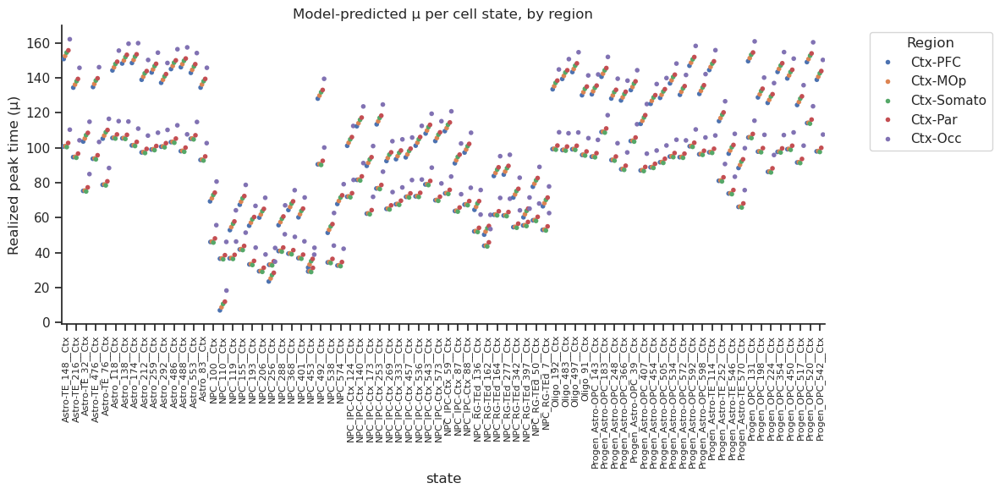

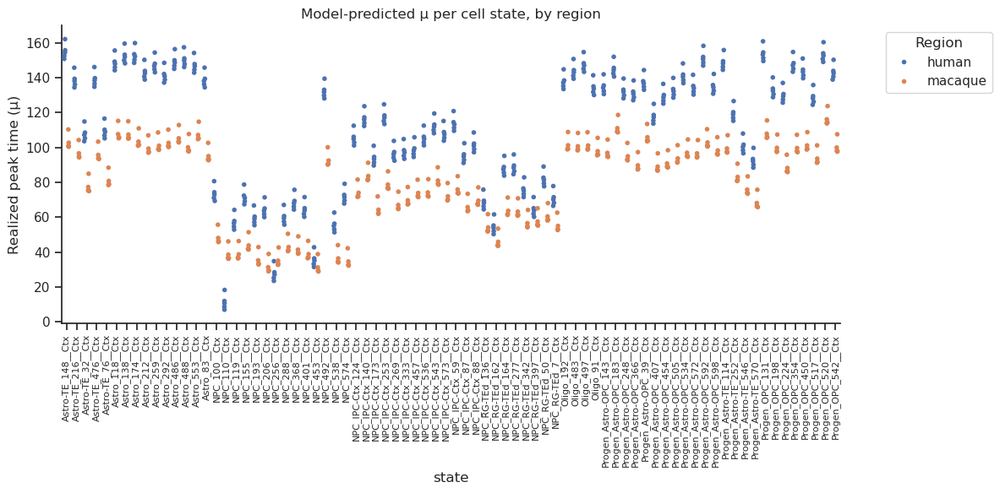

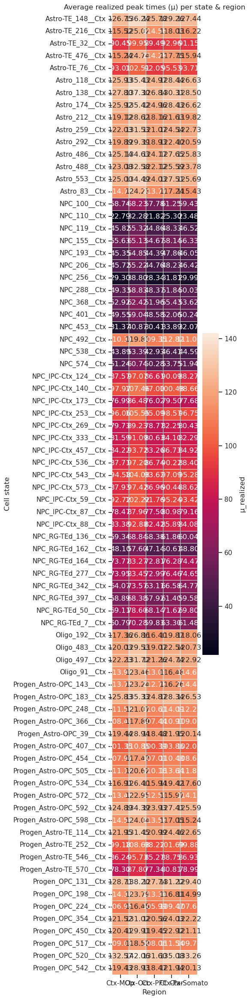

In [30]:
results_mu = []
for j, sp in enumerate(species):
    for k, reg in enumerate(regions.categories):
        # 1) latent peak on τ-scale
        mu_shifted = mu_post + delta_t_post[j] + delta_rt_post[j, k]  
        # 2) invert warp back to t-scale
        mu_realized = (mu_shifted - b_post[j]) / a_post[j]         
        # 3) un-standardize if needed:
        # mu_realized = mu_realized * t_std + t_mean

        for s_idx, st in enumerate(states):
            results_mu.append({
                "species":     sp,
                "region":      reg,
                "state":       st,
                "mu_realized": mu_realized[s_idx],
            })

real_mu_df = pd.DataFrame(results_mu)

# 1) Stripplot by state, colored by region
plt.figure(figsize=(12, 6))
seaborn.stripplot(
    data=real_mu_df,
    x="state", y="mu_realized",
    hue="region",
    dodge=True,    # separate the region‐points horizontally
    jitter=True,
    size=4
)
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Realized peak time (μ)")
plt.title("Model‐predicted μ per cell state, by region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
# plt.savefig(os.path.join(sc.settings.figdir, 'mu_realized_by_region.svg'))
plt.show()

plt.figure(figsize=(12, 6))
seaborn.stripplot(
    data=real_mu_df,
    x="state", y="mu_realized",
    hue="species",
    dodge=True,    # separate the region‐points horizontally
    jitter=True,
    size=4
)
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Realized peak time (μ)")
plt.title("Model‐predicted μ per cell state, by region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
# plt.savefig(os.path.join(sc.settings.figdir, 'mu_realized_by_region.svg'))
plt.show()


# 2) Heatmap of average μ_realized per state×region (averaged over species)
pivot_mu = real_mu_df.pivot_table(
    index="state", columns="region", values="mu_realized", aggfunc="mean"
)

plt.figure(figsize=(len(regions)*1.2, len(states)*0.3))
seaborn.heatmap(
    pivot_mu,
    annot=True, fmt=".2f",
    cbar_kws={"label": "μ_realized"},
    linewidths=0.5
)
plt.xlabel("Region")
plt.ylabel("Cell state")
plt.title("Average realized peak times (μ) per state & region")
plt.tight_layout()
plt.savefig(os.path.join(sc.settings.figdir, 'mu_realized_heatmap.svg'))
plt.show()


In [31]:
real_mu_df

,species,region,state,mu_realized
0,human,Ctx-PFC,Astro-TE_148__Ctx,150.799591
1,human,Ctx-PFC,Astro-TE_216__Ctx,134.434769
2,human,Ctx-PFC,Astro-TE_32__Ctx,103.595589
3,human,Ctx-PFC,Astro-TE_476__Ctx,134.801590
4,human,Ctx-PFC,Astro-TE_76__Ctx,105.254784
...,...,...,...,...
775,macaque,Ctx-Occ,Progen_OPC_354__Ctx,107.286598
776,macaque,Ctx-Occ,Progen_OPC_450__Ctx,108.798744
777,macaque,Ctx-Occ,Progen_OPC_517__Ctx,101.231628
778,macaque,Ctx-Occ,Progen_OPC_520__Ctx,123.760330


In [32]:
com_df['Initial_Class'] = com_df['state'].str.split('_[0-9]+__',regex=True).str[0]
com_df['cluster'] = com_df['state'].str.split('__',regex=True).str[0]
com_df['region'] = com_df['state'].str.split('_[0-9]+__',regex=True).str[1]


In [33]:
com_df['region'] = com_df['region'].astype('category')
# com_df['region'] = com_df['region'].cat.reorder_categories([ 'Ctx-PFC','Ctx-MOp', 'Ctx-Somato', 'Ctx-Par', 'Ctx-Occ'])

In [34]:
com_df

,species,state,mu,com_time,auc,dt,dh,com_realized,mu_realized,Initial_Class,cluster,region
0,human,Astro-TE_148__Ctx,13.835855,11.576313,0.301211,0.679899,5.102278,1.375339,1.554745,Astro-TE,Astro-TE_148,Ctx
1,human,Astro-TE_216__Ctx,12.536496,10.293705,0.255950,-0.427655,3.419938,1.273500,1.451577,Astro-TE,Astro-TE_216,Ctx
2,human,Astro-TE_32__Ctx,10.087879,9.655052,0.150755,0.009555,5.104987,1.222792,1.257158,Astro-TE,Astro-TE_32,Ctx
3,human,Astro-TE_476__Ctx,12.565621,11.168859,0.053836,-0.050128,2.935009,1.342987,1.453889,Astro-TE,Astro-TE_476,Ctx
4,human,Astro-TE_76__Ctx,10.219619,9.748537,0.163280,-0.193837,3.556094,1.230214,1.267618,Astro-TE,Astro-TE_76,Ctx
...,...,...,...,...,...,...,...,...,...,...,...,...
151,macaque,Progen_OPC_354__Ctx,13.215934,12.876196,0.165650,-0.032226,3.574769,0.908912,0.957673,Progen_OPC,Progen_OPC_354,Ctx
152,macaque,Progen_OPC_450__Ctx,13.432966,13.826358,0.169219,0.154161,3.379787,1.045285,0.988823,Progen_OPC,Progen_OPC_450,Ctx
153,macaque,Progen_OPC_517__Ctx,12.346891,13.761181,0.059192,0.137572,1.843167,1.035930,0.832943,Progen_OPC,Progen_OPC_517,Ctx
154,macaque,Progen_OPC_520__Ctx,15.580336,14.811953,0.622131,0.281734,3.692130,1.186743,1.297025,Progen_OPC,Progen_OPC_520,Ctx


human


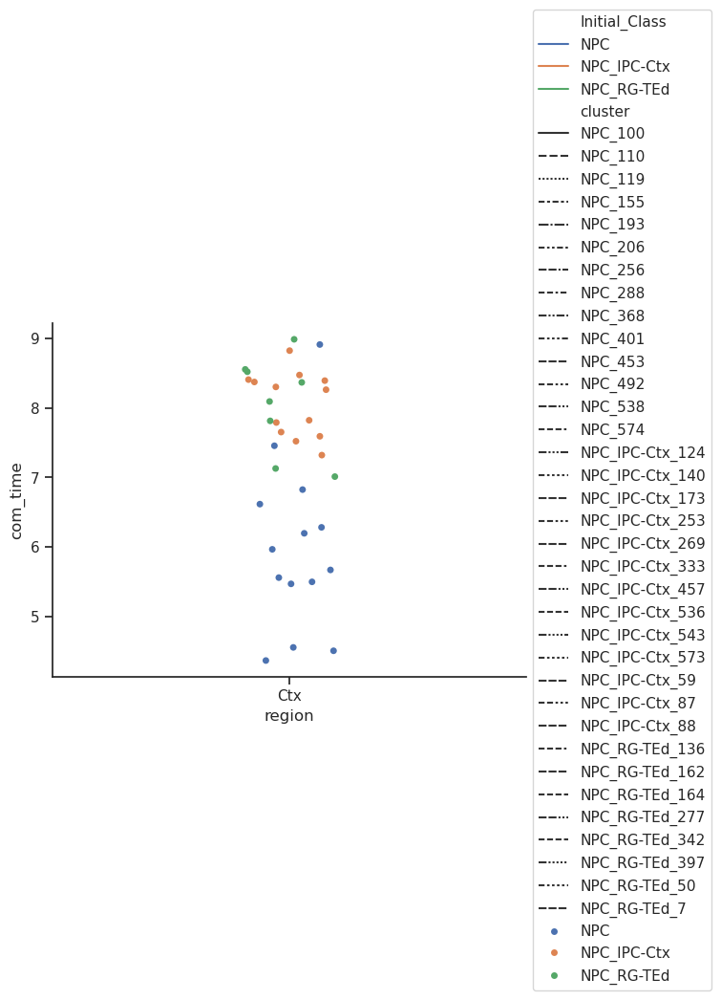

macaque


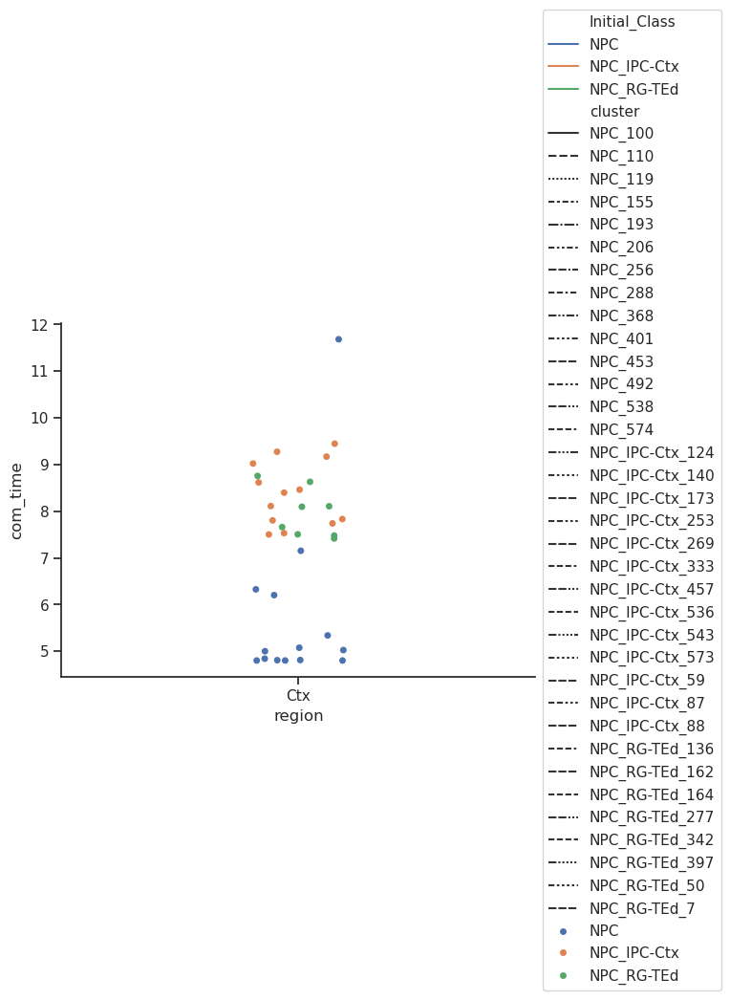

In [35]:
y = 'com_time'
for s in com_df['species'].unique():
    print(s)
    filt = com_df['Initial_Class'].str.contains('NPC')&(com_df['species']==s)
    ax = seaborn.lineplot(data=com_df.loc[filt,:],x='region',y=y,hue='Initial_Class',style='cluster')
    ax = seaborn.stripplot(data=com_df.loc[filt,:],x='region',y=y,hue='Initial_Class')
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    plt.show()

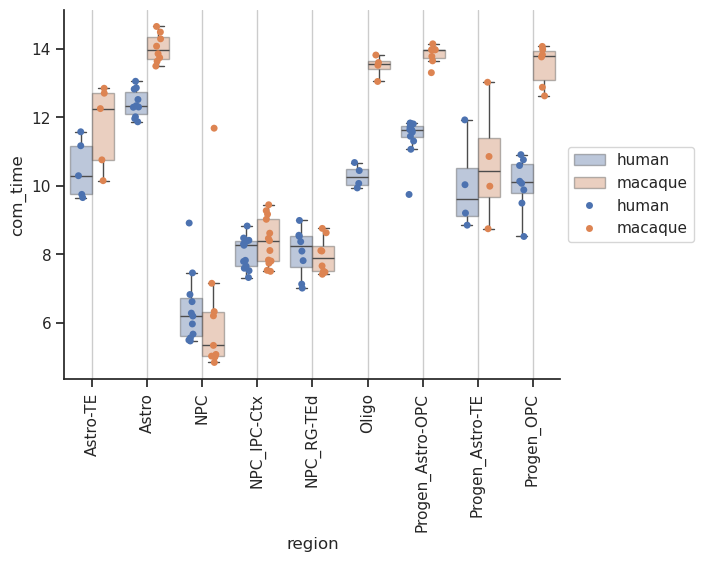

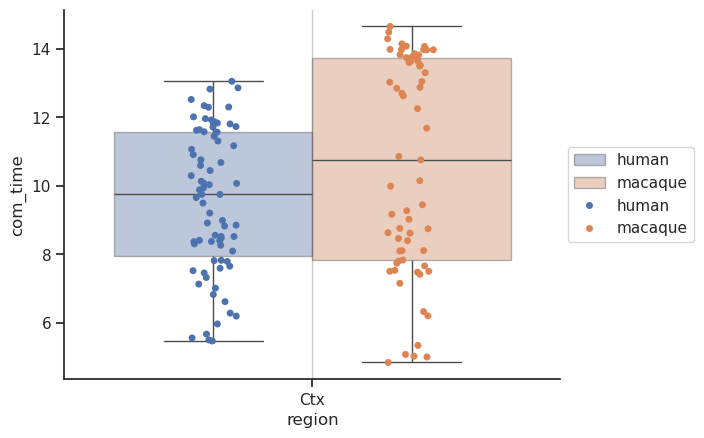

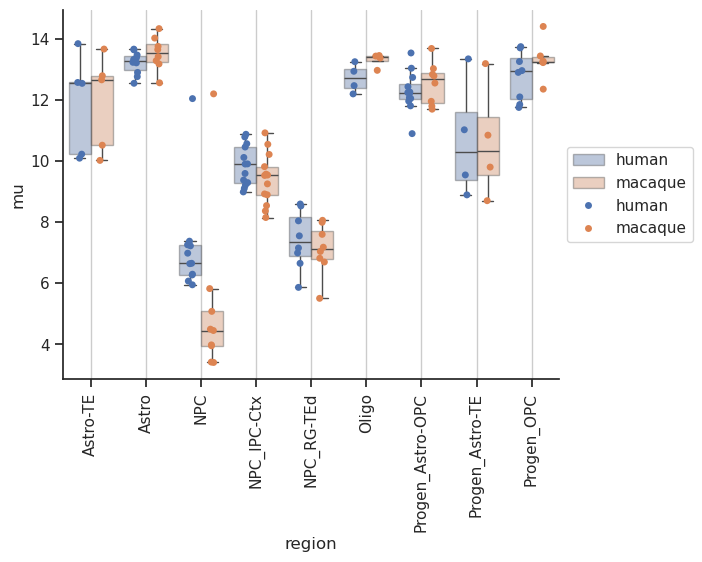

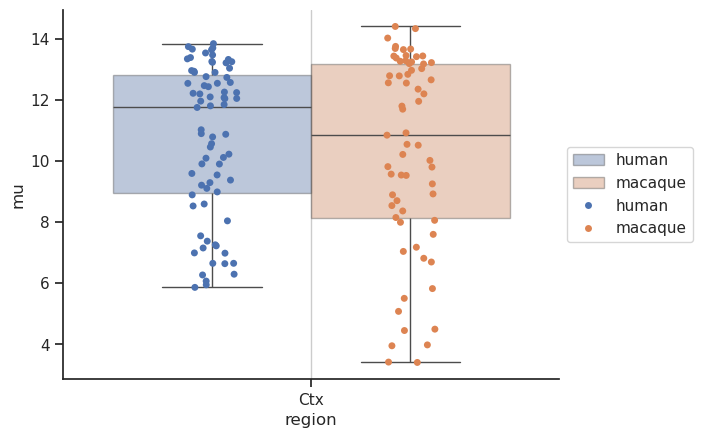

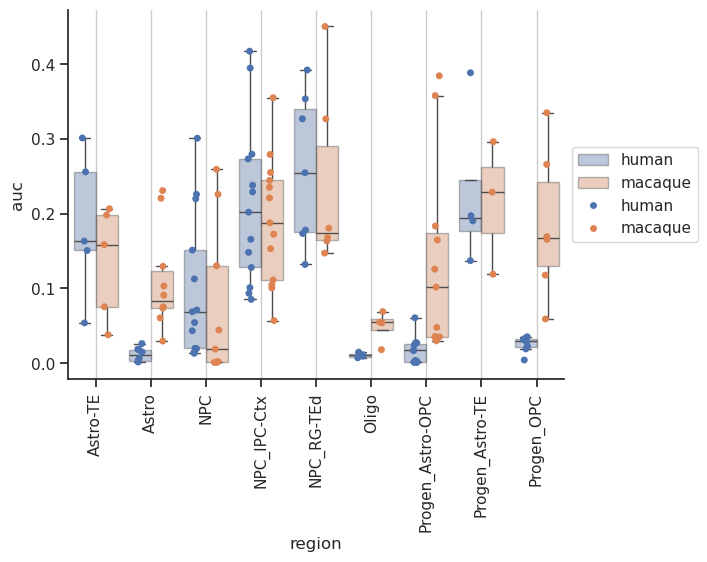

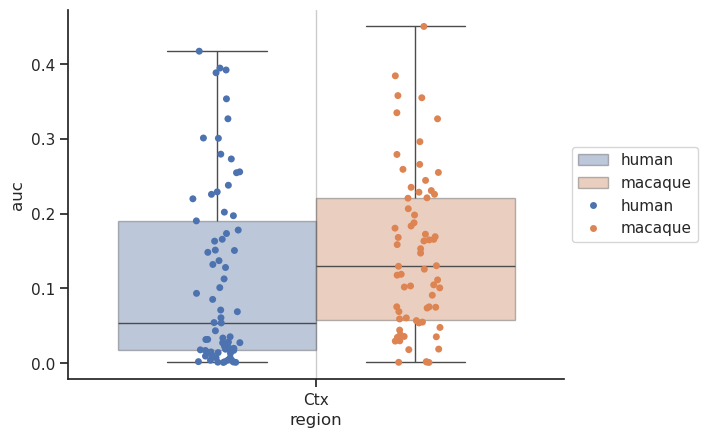

In [36]:
for stat in ['com_time','mu','auc']:
    if stat != 'mu':
        plot_range = (com_df[stat]>np.quantile(com_df[stat],.05))&(com_df[stat]<np.quantile(com_df[stat],.95))
        plot_com_df = com_df.loc[plot_range,:]
    # com_df['clipped_stat'] = np.clip(com_df[stat],np.quantile(com_df[stat],.05),np.quantile(com_df[stat],.95))
    ax = seaborn.boxplot(data=plot_com_df,y=stat,x='Initial_Class',hue='species',showfliers=False,boxprops={'alpha': 0.4})
    ax = seaborn.stripplot(data=plot_com_df,y=stat,x='Initial_Class',hue='species',dodge=True)
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    plt.xticks(rotation=90)
    plt.ylabel(stat)
    plt.xlabel('region')
    ax.grid(axis='x')
    plt.show()
    
    
    ax = seaborn.boxplot(data=plot_com_df,y=stat,x='region',hue='species',showfliers=False,boxprops={'alpha': 0.4})
    ax = seaborn.stripplot(data=plot_com_df,y=stat,x='region',hue='species',dodge=True)
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    # plt.xticks(rotation=90)
    plt.ylabel(stat)
    plt.xlabel('region')
    ax.grid(axis='x')
    plt.show()


<Axes: >

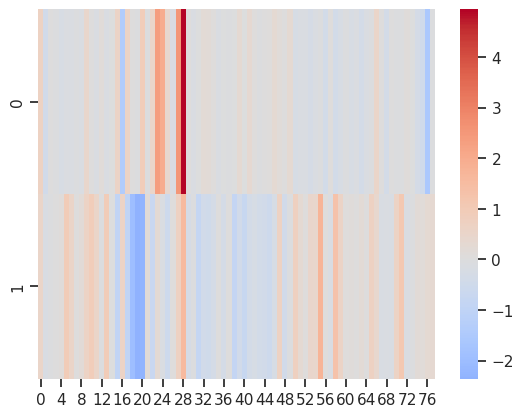

In [37]:
seaborn.heatmap(delta_t_post,cmap='coolwarm',center=0.)

<Axes: >

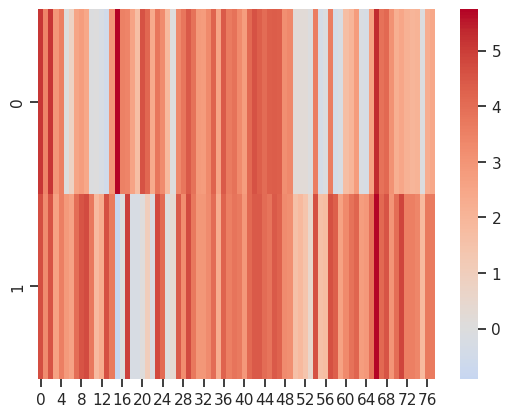

In [38]:
seaborn.heatmap(delta_h_post,cmap='coolwarm',center=0.)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:615: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)


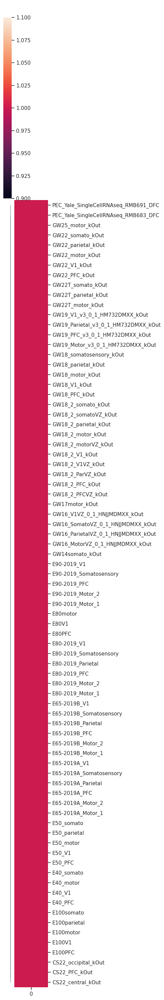

In [39]:
seaborn.clustermap(region_probs_df,yticklabels=True,figsize=(5,30),col_cluster=False)
plt.savefig(os.path.join(sc.settings.figdir,f'fit_region_batch_clustermap_ctx.svg'))


In [40]:
counts_pivot_meta['region'] = counts_pivot_meta['region'].astype('category')
real_region_oh = antipode.model_functions.numpy_onehot( counts_pivot_meta['region'].cat.codes)

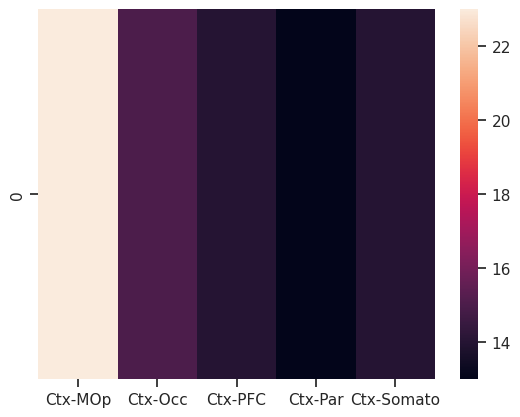

In [41]:
seaborn.heatmap(pd.DataFrame(region_probs_df.T.to_numpy() @ real_region_oh,columns=counts_pivot_meta['region'].cat.categories))
plt.savefig(os.path.join(sc.settings.figdir,f'fit_region_batch_clustermap_ctx.svg'))


/scratch/fast/1600582/ipykernel_3273583/1833071312.py:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


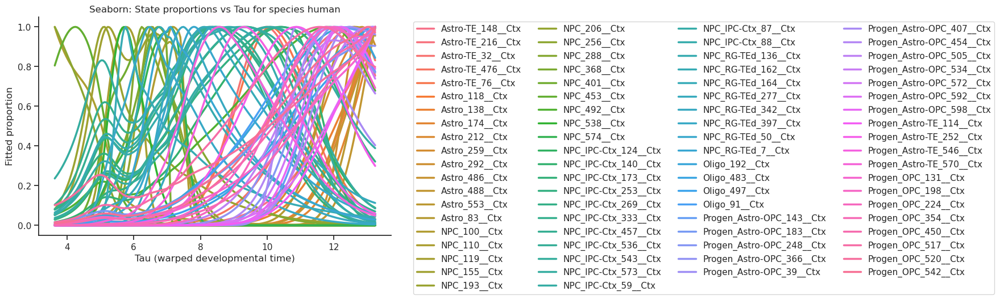

/scratch/fast/1600582/ipykernel_3273583/1833071312.py:67: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None)


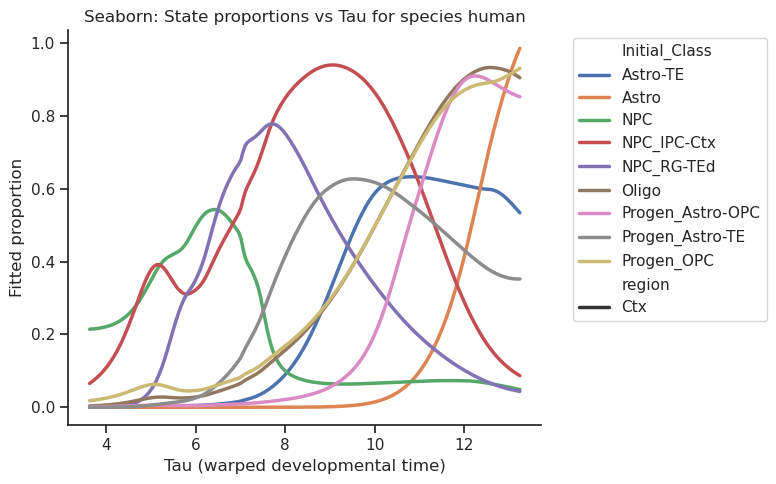

/scratch/fast/1600582/ipykernel_3273583/1833071312.py:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


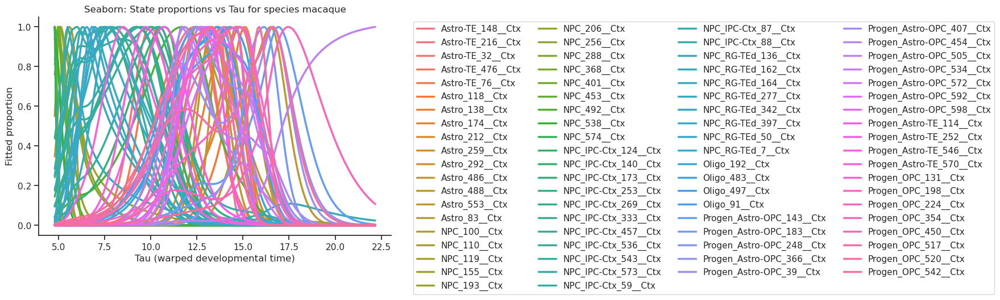

/scratch/fast/1600582/ipykernel_3273583/1833071312.py:67: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None)


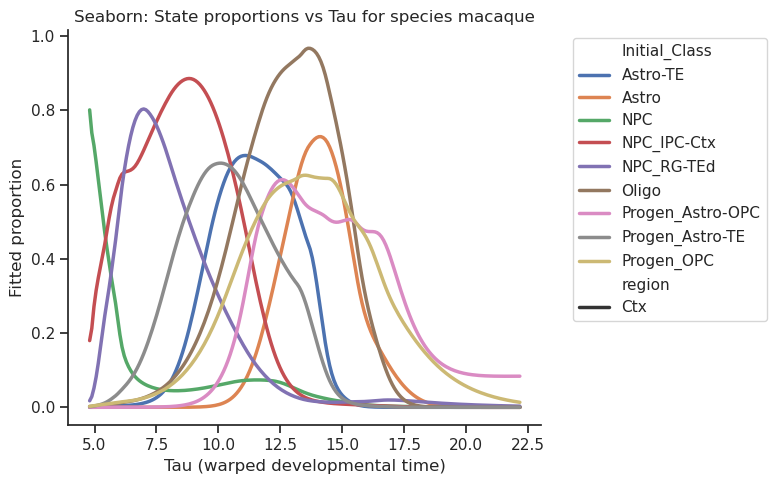

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Assume we have posterior mean parameters mu_post, sigma_rise_post, sigma_fall_post, A_post, a_post, b_post
# Also assume states list, species list, and we focus on one species for clarity (e.g., species index 0)

# Example: Visualize for species 0
for species_idx in range(2):

    # Generate a grid of tau values
    tau_min = t.min().item() * a_post[species_idx] + b_post[species_idx]
    tau_max = t.max().item() * a_post[species_idx] + b_post[species_idx]
    taus = np.linspace(tau_min, tau_max, 200)
    
    # Compute predicted proportions for each state
    pi_preds = []
    for s in range(num_states):
        # piecewise sigma
        mu_s = mu_post[s] + delta_t_post[species_idx,s]
        sigma_rise_s = sigma_rise_post[s]
        sigma_fall_s = sigma_fall_post[s]
        A_s = A_post[s]
        
        # widths for each tau
        sigmas = np.where(taus < mu_s, sigma_rise_s, sigma_fall_s)
        # logits
        logits = A_s - ((taus - mu_s)**2) / (2 * sigmas**2)
        # softmax across states: evaluate all state logits then softmax
        # but for now store logits to compute softmax later
        pi_preds.append(logits)
    
    # Convert logits list to array shape [states, taus]
    logits_arr = np.array(pi_preds)
    
    # Softmax along states axis for each tau
    exp_logits = np.exp(logits_arr - np.max(logits_arr, axis=0))
    proportions = exp_logits / exp_logits.sum(axis=0)
    
    
    # Plotting with Seaborn (long-form DataFrame)
    df_list = []
    for s, state in enumerate(states):
        df_list.append(pd.DataFrame({
            "tau": taus,
            "proportion": proportions[s, :]/proportions[s, :].max(),
            "state": state
        }))
    df_pred = pd.concat(df_list, ignore_index=True)
    df_pred['region'] = df_pred['state'].str.split('__').str[1]
    df_pred['Initial_Class'] = df_pred['state'].str.split('_[0-9]+__',regex=True).str[0]
    
    plt.figure(figsize=(8, 5))
    sns.lineplot(data=df_pred, x="tau", y="proportion", hue="state", linewidth=2.5)
    plt.xlabel("Tau (warped developmental time)")
    plt.ylabel("Fitted proportion")
    plt.title(f"Seaborn: State proportions vs Tau for species {species[species_idx]}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',ncol=4)
    plt.tight_layout()
    plt.savefig(os.path.join(sc.settings.figdir,f'{species[species_idx]}_type_progression_ctx.svg'))
    plt.show()
    
    plt.figure(figsize=(8, 5))
    sns.lineplot(data=df_pred, x="tau", y="proportion", hue="Initial_Class",style='region', linewidth=2.5,ci=None)
    plt.xlabel("Tau (warped developmental time)")
    plt.ylabel("Fitted proportion")
    plt.title(f"Seaborn: State proportions vs Tau for species {species[species_idx]}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(sc.settings.figdir,f'{species[species_idx]}_region_type_progression_ctx.svg'))
    plt.show()


In [43]:
com_df.to_csv(os.path.join(out_path,'ctx_model_fit_com_df.tsv'),sep='\t')